In [1]:
import sys
sys.path.append("../") # adding the path to read the utils file
from sklearnex import patch_sklearn
patch_sklearn(global_patch=True)
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, StratifiedKFold
from catboost import CatBoostClassifier
from sklearn import metrics, tree
from shap import TreeExplainer
import fasttreeshap
from shap import plots, Explanation
import graphviz 
from yellowbrick.model_selection import LearningCurve
import time
import shap
from utils import *
import pickle
import glob
from yellowbrick.classifier import ROCAUC
from yellowbrick.contrib.wrapper import wrap

pd.set_option('display.max_columns', None)

Scikit-learn was successfully globally patched by Intel(R) Extension for Scikit-learn


Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)
IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


In [2]:
ds = pd.concat([pd.read_csv(csv_file, engine='pyarrow', index_col='id') for csv_file in glob.glob('../datasets/NFS-2023-nTE/*.csv')], ignore_index=True)
ds.head()

,expiration_id,src_ip,src_mac,src_oui,src_port,dst_ip,dst_mac,dst_oui,dst_port,protocol,ip_version,vlan_id,bidirectional_first_seen_ms,bidirectional_last_seen_ms,bidirectional_duration_ms,bidirectional_packets,bidirectional_bytes,src2dst_first_seen_ms,src2dst_last_seen_ms,src2dst_duration_ms,src2dst_packets,src2dst_bytes,dst2src_first_seen_ms,dst2src_last_seen_ms,dst2src_duration_ms,dst2src_packets,dst2src_bytes,bidirectional_min_ps,bidirectional_mean_ps,bidirectional_stddev_ps,bidirectional_max_ps,src2dst_min_ps,src2dst_mean_ps,src2dst_stddev_ps,src2dst_max_ps,dst2src_min_ps,dst2src_mean_ps,dst2src_stddev_ps,dst2src_max_ps,bidirectional_min_piat_ms,bidirectional_mean_piat_ms,bidirectional_stddev_piat_ms,bidirectional_max_piat_ms,src2dst_min_piat_ms,src2dst_mean_piat_ms,src2dst_stddev_piat_ms,src2dst_max_piat_ms,dst2src_min_piat_ms,dst2src_mean_piat_ms,dst2src_stddev_piat_ms,dst2src_max_piat_ms,bidirectional_syn_packets,bidirectional_cwr_packets,bidirectional_ece_packets,bidirectional_urg_packets,bidirectional_ack_packets,bidirectional_psh_packets,bidirectional_rst_packets,bidirectional_fin_packets,src2dst_syn_packets,src2dst_cwr_packets,src2dst_ece_packets,src2dst_urg_packets,src2dst_ack_packets,src2dst_psh_packets,src2dst_rst_packets,src2dst_fin_packets,dst2src_syn_packets,dst2src_cwr_packets,dst2src_ece_packets,dst2src_urg_packets,dst2src_ack_packets,dst2src_psh_packets,dst2src_rst_packets,dst2src_fin_packets,label
0,1,192.168.10.50,00:19:b9:0a:69:f1,00:19:b9,33898,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,389,6,4,0,1499342340490,1499342453585,113095,36,12216,1499342340490,1499342453585,113095,24,6418,1499342340490,1499342453585,113095,12,5798,66,339.333333,236.650194,989,66,267.416667,205.748880,469,382,483.166667,236.274430,989,0,3231.285714,6169.592586,16483,0,4917.173913,7082.328024,16483,3,10281.363636,7053.298154,16483,0,0,0,0,36,24,0,0,0,0,0,0,24,12,0,0,0,0,0,0,12,12,0,0,BENIGN
1,1,192.168.10.50,00:19:b9:0a:69:f1,00:19:b9,33904,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,389,6,4,0,1499342340491,1499342453964,113473,54,15605,1499342340491,1499342453964,113473,34,7926,1499342340491,1499342453918,113427,20,7679,66,288.981481,200.112750,1205,66,233.117647,173.216936,469,192,383.950000,210.983780,1205,0,2141.000000,5223.952902,16483,0,3438.575758,6304.323294,16483,0,5969.842105,7399.526406,16483,0,0,0,0,54,40,0,0,0,0,0,0,34,20,0,0,0,0,0,0,20,20,0,0,BENIGN
2,0,192.168.10.14,b8:ac:6f:36:07:ee,b8:ac:6f,59555,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,53,17,4,0,1499342357298,1499342357299,1,2,296,1499342357298,1499342357298,0,1,93,1499342357299,1499342357299,0,1,203,93,148.000000,77.781746,203,93,93.000000,0.000000,93,203,203.000000,0.000000,203,1,1.000000,0.000000,1,0,0.000000,0.000000,0,0,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,BENIGN
3,0,192.168.10.14,b8:ac:6f:36:07:ee,b8:ac:6f,59135,65.55.44.109,00:c1:b1:14:eb:31,00:c1:b1,443,6,4,0,1499342357299,1499342417611,60312,18,7559,1499342357299,1499342417611,60312,10,2888,1499342357349,1499342417610,60261,8,4671,60,419.944444,522.680700,1514,60,288.800000,393.690177,1147,60,583.875000,639.465723,1514,0,3547.764706,14539.437969,59969,0,6701.333333,19975.413926,59969,0,8608.714286,22683.047882,60049,2,0,0,0,17,7,0,2,1,0,0,0,9,4,0,1,1,0,0,0,8,3,0,1,BENIGN
4,0,192.168.10.50,00:19:b9:0a:69:f1,00:19:b9,123,129.6.15.29,00:c1:b1:14:eb:31,00:c1:b1,123,17,4,0,1499342395411,1499342395442,31,2,180,1499342395411,1499342395411,0,1,90,1499342395442,1499342395442,0,1,90,90,90.000000,0.000000,90,90,90.000000,0.000000,90,90,90.000000,0.000000,90,31,31.000000,0.000000,31,0,0.000000,0.000000,0,0,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,BENIGN


In [3]:
ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2111131 entries, 0 to 2111130
Data columns (total 76 columns):
 #   Column                        Dtype  
---  ------                        -----  
 0   expiration_id                 int64  
 1   src_ip                        object 
 2   src_mac                       object 
 3   src_oui                       object 
 4   src_port                      int64  
 5   dst_ip                        object 
 6   dst_mac                       object 
 7   dst_oui                       object 
 8   dst_port                      int64  
 9   protocol                      int64  
 10  ip_version                    int64  
 11  vlan_id                       int64  
 12  bidirectional_first_seen_ms   int64  
 13  bidirectional_last_seen_ms    int64  
 14  bidirectional_duration_ms     int64  
 15  bidirectional_packets         int64  
 16  bidirectional_bytes           int64  
 17  src2dst_first_seen_ms         int64  
 18  src2dst_last_seen_ms  

In [4]:
compute_ratio(ds,'label')

                            Ratio
label                            
BENIGN                      76.37
PortScan                    10.61
DoS Hulk                     7.49
DDoS                         4.41
DoS GoldenEye                0.37
DoS slowloris                0.25
FTP-Patator                  0.19
SSH-Patator                  0.14
DoS Slowhttptest             0.13
Bot                          0.03
Web Attack - Brute Force     0.01
Web Attack - XSS             0.00
Infiltration                 0.00
Web Attack - Sql Injection   0.00
Heartbleed                   0.00


In [5]:
ds.label.value_counts()

label
BENIGN                        1612267
PortScan                       223886
DoS Hulk                       158027
DDoS                            93178
DoS GoldenEye                    7916
DoS slowloris                    5192
FTP-Patator                      3992
SSH-Patator                      2980
DoS Slowhttptest                 2727
Bot                               738
Web Attack - Brute Force          151
Web Attack - XSS                   27
Infiltration                       27
Web Attack - Sql Injection         12
Heartbleed                         11
Name: count, dtype: int64

In [6]:
ds = ds.drop(columns=feature_to_remove_NFS)

In [7]:
sample_weights = ds.label.value_counts().to_dict()

In [8]:
sample_weights['BENIGN'] = 738
sample_weights['PortScan'] = 738
sample_weights['DoS Hulk'] = 738
sample_weights['DDoS'] = 738
sample_weights['FTP-Patator'] = 738
sample_weights['DoS GoldenEye'] = 738
sample_weights['DoS slowloris'] = 738
sample_weights['SSH-Patator'] = 738
sample_weights['DoS Slowhttptest'] = 738

In [9]:
params = {
    'iterations': 40,
    'depth': 9,
    'learning_rate': 0.1,
    'loss_function': 'MultiClass',
    'verbose': True
}

cat = CatBoostClassifier(**params)

rus = RandomUnderSampler(random_state=42, sampling_strategy=sample_weights)
X_res, y_res = rus.fit_resample(ds.drop(columns=['label']), ds['label'])

In [10]:
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size = 0.2, random_state=12, shuffle=True, stratify=y_res)

In [11]:
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
skf.get_n_splits(X_res, y_res)

5

In [12]:
avg_train_f1 = []
avg_test_f1 = []

for i, (train_index, test_index) in enumerate(skf.split(X_res, y_res)):
    print(f"Fold {i}:")
    cat.fit(X_res.iloc[train_index], y_res.iloc[train_index])
    y_predicted_train = cat.predict(X_res.iloc[train_index])
    y_predicted_test = cat.predict(X_res.iloc[test_index])
    train_f1 = metrics.f1_score(y_res.iloc[train_index], y_predicted_train, average='weighted')
    test_f1 = metrics.f1_score(y_res.iloc[test_index], y_predicted_test, average='weighted')
    print(f"Train F1: {train_f1:.4f}")
    print(f"Test F1: {test_f1:.4f}")
    avg_train_f1.append(train_f1)
    avg_test_f1.append(test_f1)

print(f"Average Train F1: {np.mean(avg_train_f1):.4f}")
print(f"Average Test F1: {np.mean(avg_test_f1):.4f}")

Fold 0:
0:	learn: 1.7583381	total: 314ms	remaining: 12.3s
1:	learn: 1.4197572	total: 546ms	remaining: 10.4s
2:	learn: 1.1979008	total: 793ms	remaining: 9.78s
3:	learn: 1.0345185	total: 1.06s	remaining: 9.54s
4:	learn: 0.9058205	total: 1.34s	remaining: 9.4s
5:	learn: 0.8017723	total: 1.62s	remaining: 9.2s
6:	learn: 0.7143009	total: 1.9s	remaining: 8.97s
7:	learn: 0.6417821	total: 2.2s	remaining: 8.82s
8:	learn: 0.5809072	total: 2.51s	remaining: 8.64s
9:	learn: 0.5264536	total: 2.79s	remaining: 8.38s
10:	learn: 0.4805132	total: 3.08s	remaining: 8.13s
11:	learn: 0.4405230	total: 3.37s	remaining: 7.87s
12:	learn: 0.4046853	total: 3.66s	remaining: 7.6s
13:	learn: 0.3735802	total: 3.94s	remaining: 7.32s
14:	learn: 0.3454823	total: 4.23s	remaining: 7.04s
15:	learn: 0.3213222	total: 4.51s	remaining: 6.77s
16:	learn: 0.2985572	total: 4.79s	remaining: 6.48s
17:	learn: 0.2792291	total: 5.07s	remaining: 6.2s
18:	learn: 0.2607565	total: 5.35s	remaining: 5.91s
19:	learn: 0.2447383	total: 5.63s	remai

In [13]:
%time cat.fit(X_train, y_train)

0:	learn: 1.7504633	total: 371ms	remaining: 14.5s
1:	learn: 1.4185498	total: 709ms	remaining: 13.5s
2:	learn: 1.2023133	total: 1.06s	remaining: 13.1s
3:	learn: 1.0438645	total: 1.41s	remaining: 12.7s
4:	learn: 0.9116252	total: 1.79s	remaining: 12.5s
5:	learn: 0.8044949	total: 2.15s	remaining: 12.2s
6:	learn: 0.7173478	total: 2.51s	remaining: 11.8s
7:	learn: 0.6436669	total: 2.85s	remaining: 11.4s
8:	learn: 0.5828748	total: 3.21s	remaining: 11s
9:	learn: 0.5310846	total: 3.56s	remaining: 10.7s
10:	learn: 0.4842650	total: 3.9s	remaining: 10.3s
11:	learn: 0.4430643	total: 4.26s	remaining: 9.95s
12:	learn: 0.4060837	total: 4.61s	remaining: 9.57s
13:	learn: 0.3734124	total: 4.96s	remaining: 9.22s
14:	learn: 0.3428596	total: 5.32s	remaining: 8.87s
15:	learn: 0.3184948	total: 5.66s	remaining: 8.5s
16:	learn: 0.2959350	total: 6s	remaining: 8.12s
17:	learn: 0.2733740	total: 6.35s	remaining: 7.76s
18:	learn: 0.2550740	total: 6.7s	remaining: 7.41s
19:	learn: 0.2391343	total: 7.05s	remaining: 7.05

In [14]:
%time y_predicted_train = cat.predict(X_train)
%time y_predicted_test = cat.predict(X_test)

CPU times: user 23.2 ms, sys: 6.81 ms, total: 30 ms
Wall time: 10.5 ms
CPU times: user 11.4 ms, sys: 44 µs, total: 11.4 ms
Wall time: 9.08 ms


In [15]:
performanceMetricsDFWeighted(metrics, y_train, y_predicted_train, y_test, y_predicted_test, 'weighted')

,Measure,Train,Test
0,ACCURACY,0.990799,0.983574
1,PRECISION,0.990827,0.983780
2,RECALL,0.990799,0.983574
3,F1 SCORE,0.990709,0.983032


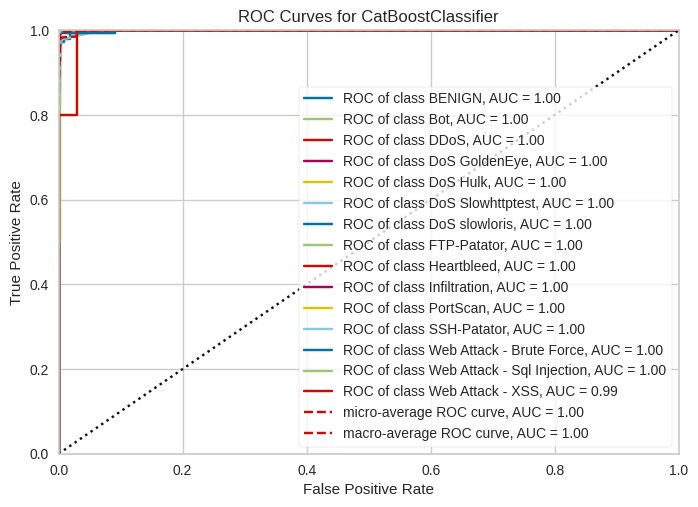

<Axes: title={'center': 'ROC Curves for CatBoostClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [16]:
model = wrap(cat)
visualizer = ROCAUC(model)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.show()

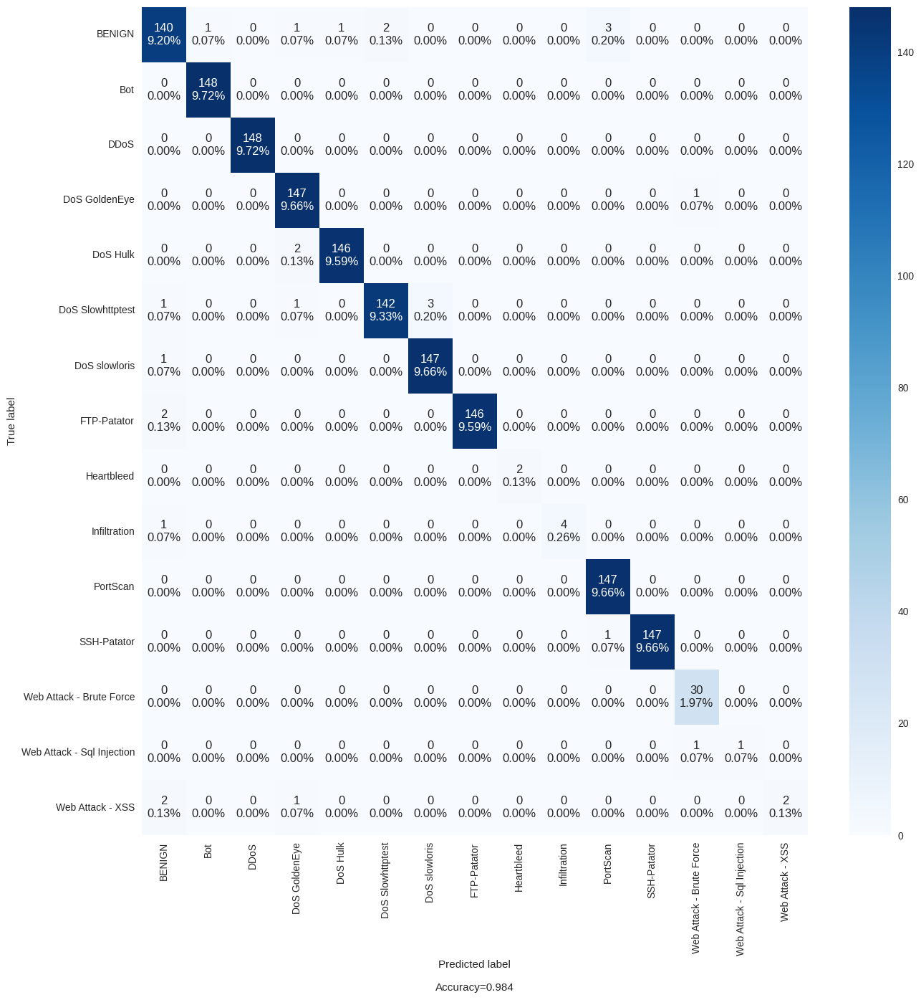

In [17]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(cat.classes_)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

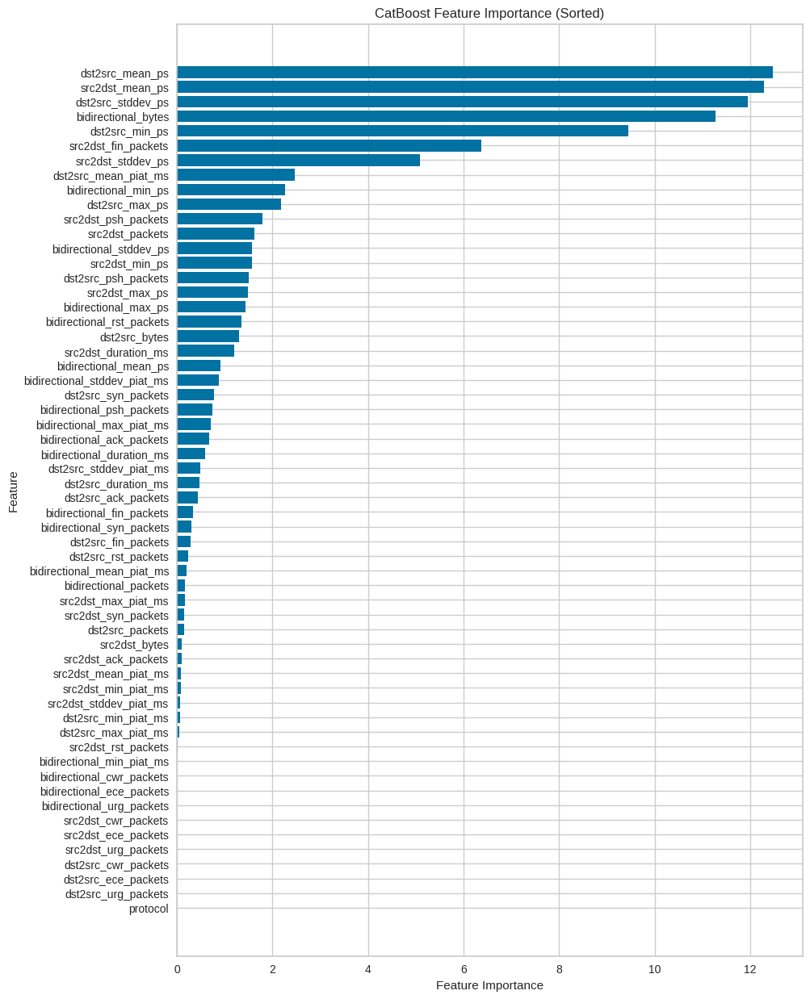

In [18]:
# Retrieve feature importance
feature_importance = model.get_feature_importance(type="FeatureImportance")
feature_names = X_train.columns

# Sort the features and feature importance scores
sorted_indices = np.argsort(feature_importance)
sorted_feature_importance = feature_importance[sorted_indices]
sorted_feature_names = feature_names[sorted_indices]

# Plot the sorted feature importance
plt.figure(figsize=(10, 15))
plt.barh(sorted_feature_names, sorted_feature_importance)
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('CatBoost Feature Importance (Sorted)')
plt.show()

Using interventional to stay "true to the model" since we will use this data to do feature reduction and we want also to understand how things work

In [19]:
%%time

explainer = fasttreeshap.TreeExplainer(cat, algorithm='auto', n_jobs=-1) 
sv = explainer(X_train)

CPU times: user 1min 34s, sys: 819 ms, total: 1min 35s
Wall time: 11.6 s


In [20]:
cat.classes_

array(['BENIGN', 'Bot', 'DDoS', 'DoS GoldenEye', 'DoS Hulk',
       'DoS Slowhttptest', 'DoS slowloris', 'FTP-Patator', 'Heartbleed',
       'Infiltration', 'PortScan', 'SSH-Patator',
       'Web Attack - Brute Force', 'Web Attack - Sql Injection',
       'Web Attack - XSS'], dtype=object)

## Benign shap

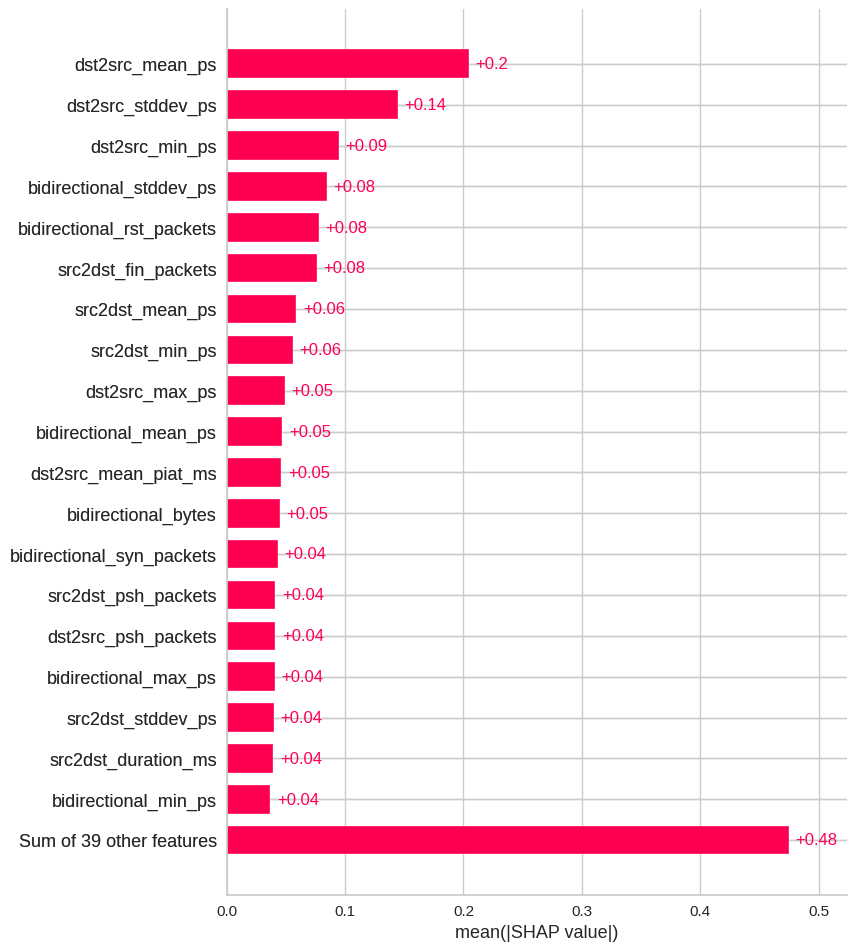

In [21]:
exp = Explanation(sv.values[:,:,0], 
                  sv.base_values[:,0], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

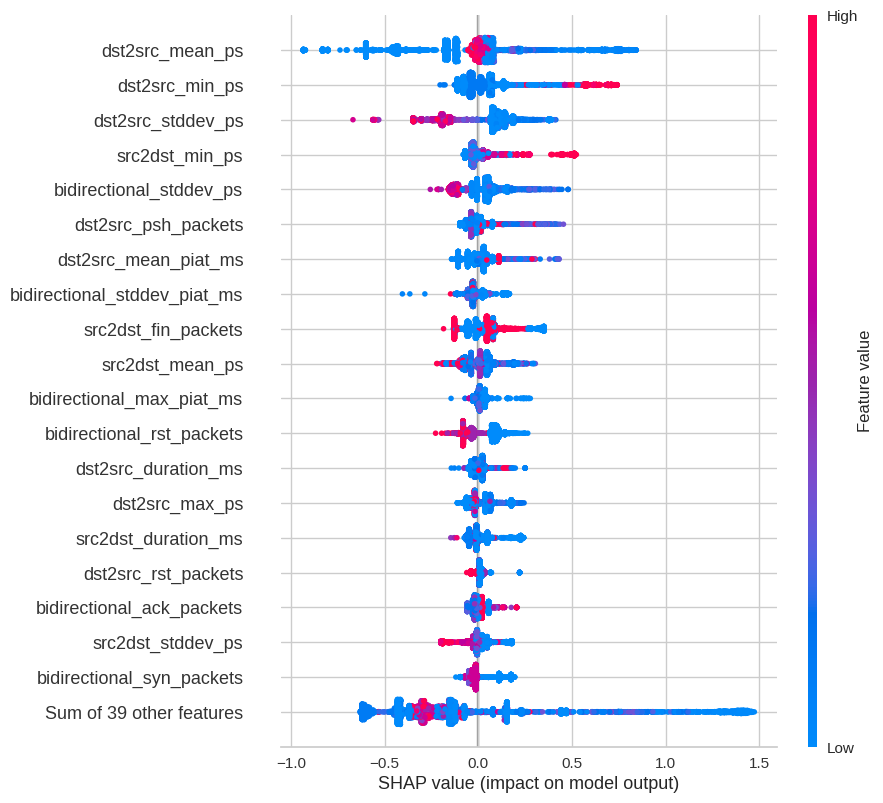

In [22]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

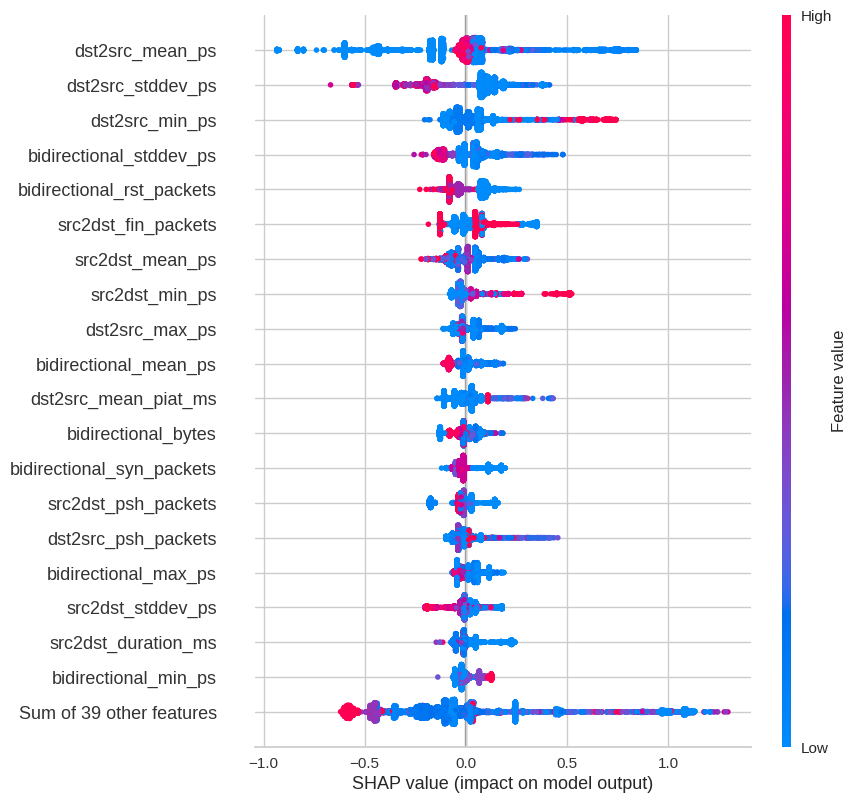

In [23]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Bot shap

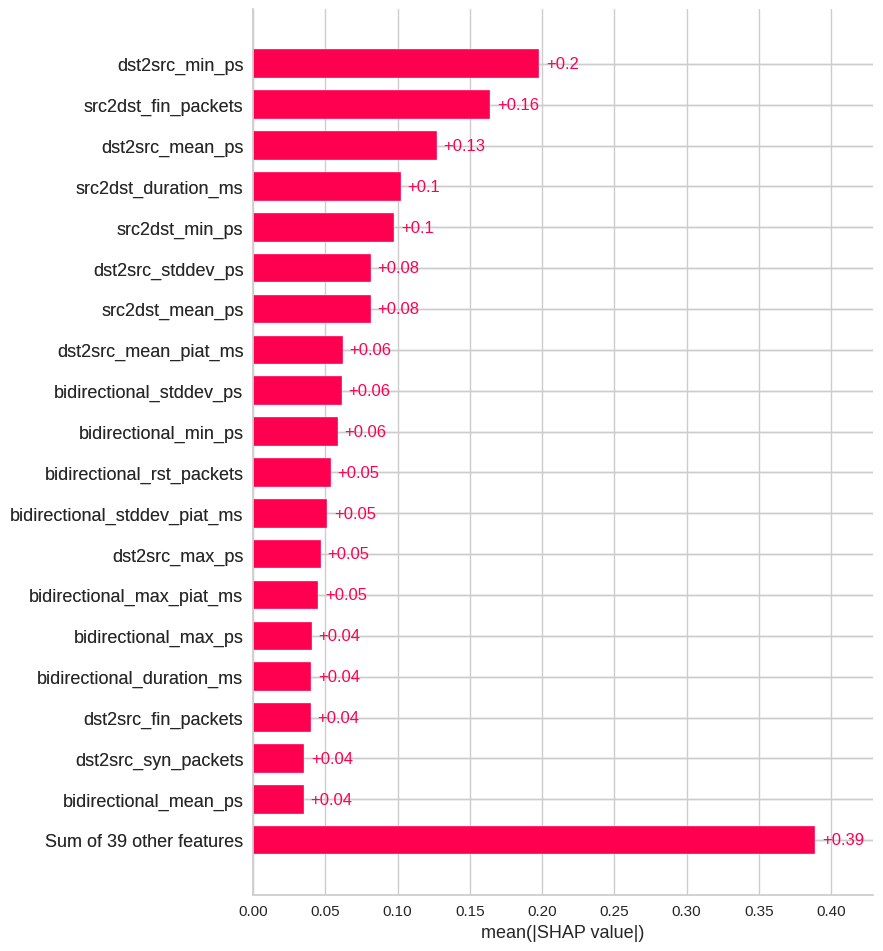

In [24]:
exp = Explanation(sv.values[:,:,1], 
                  sv.base_values[:,1], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)

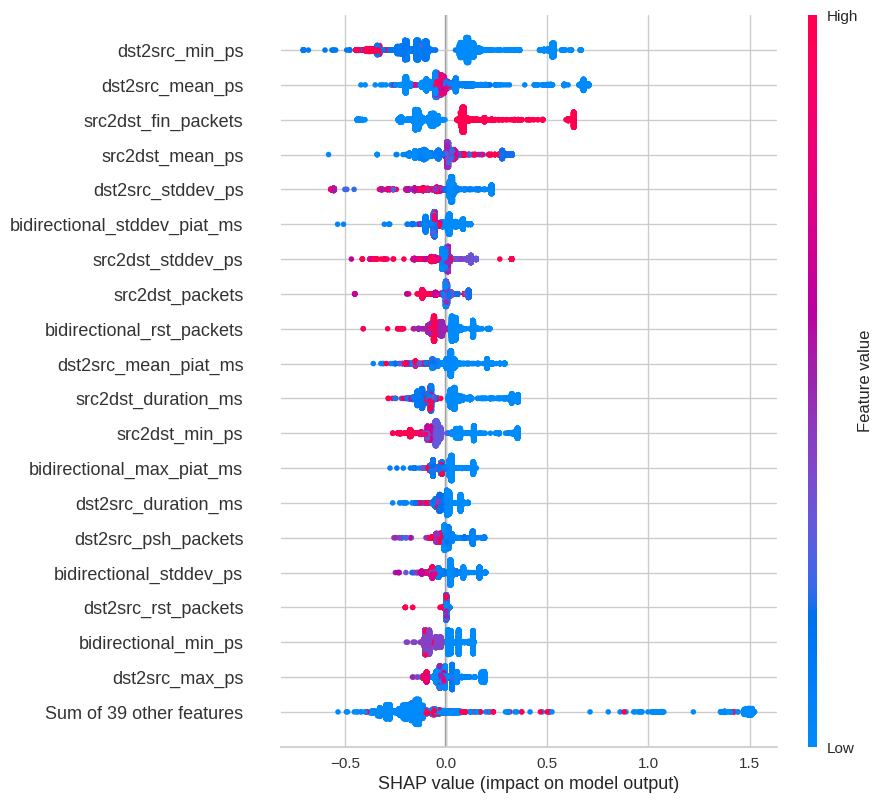

In [25]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

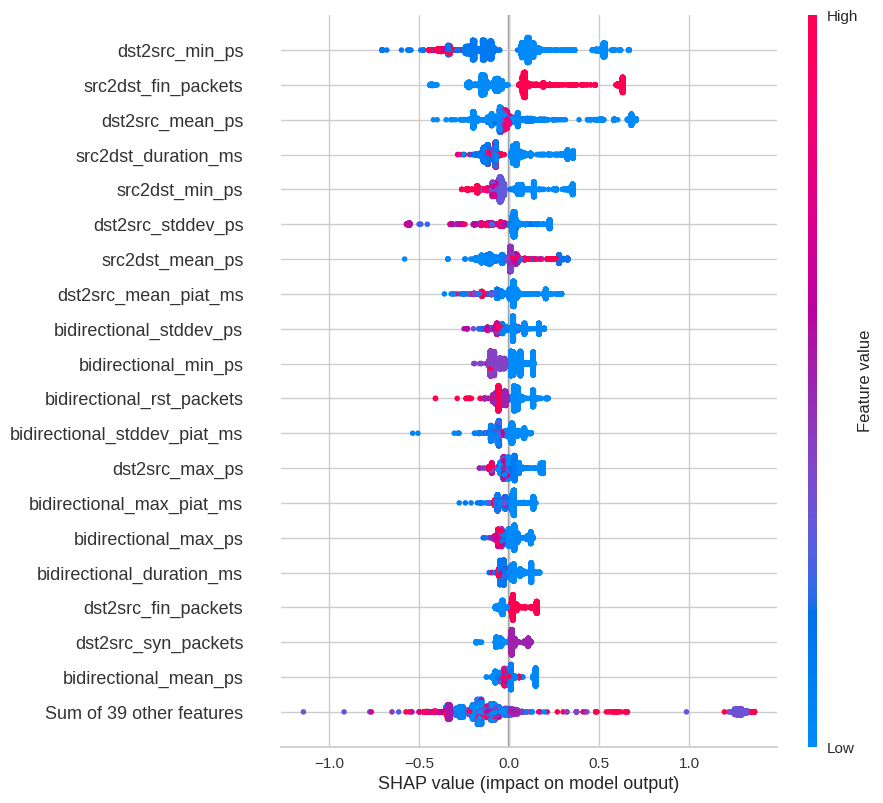

In [26]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## DDoS shap

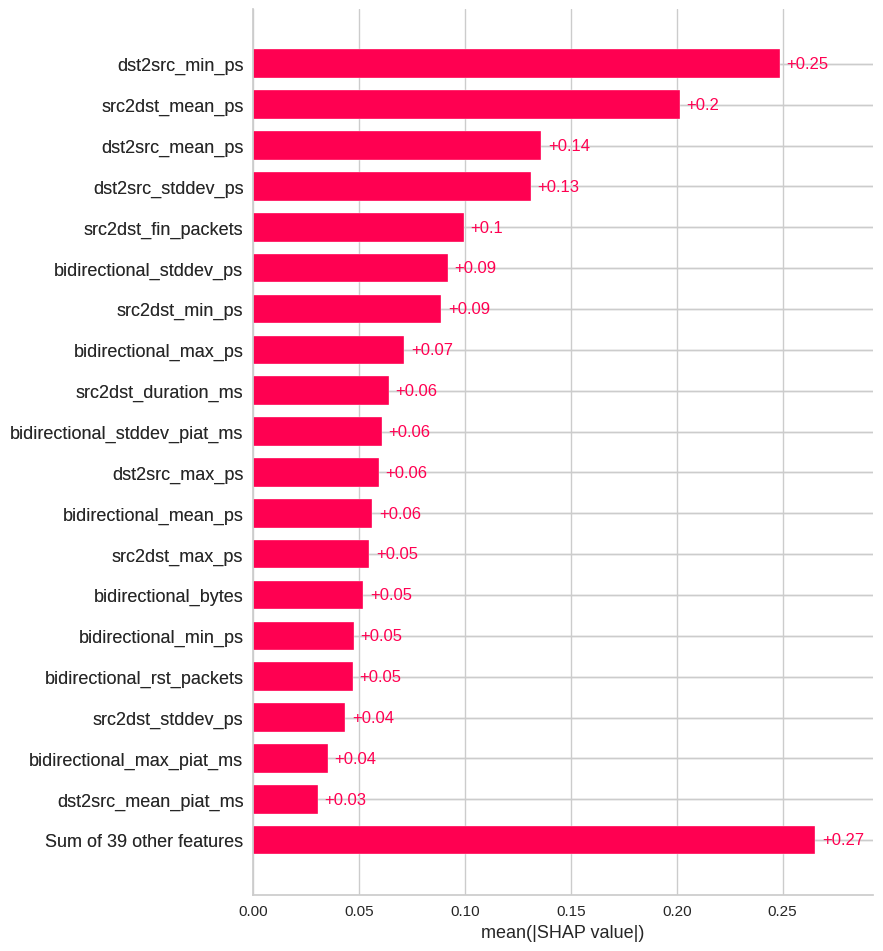

In [27]:
exp = Explanation(sv.values[:,:,2], 
                  sv.base_values[:,2], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)

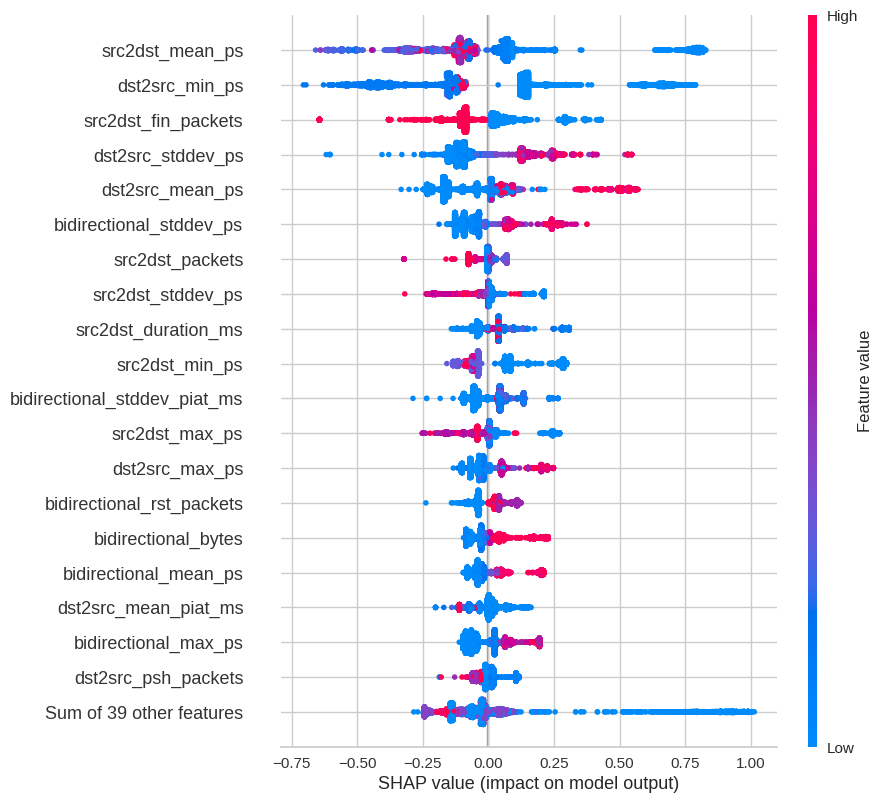

In [28]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

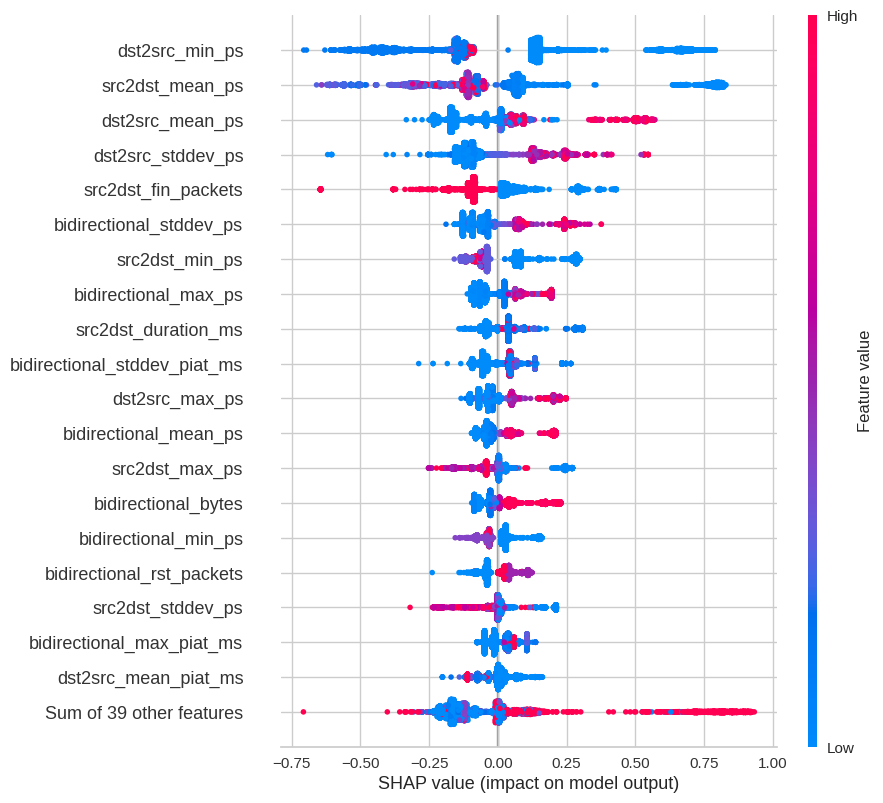

In [29]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## DoS GoldenEye shap

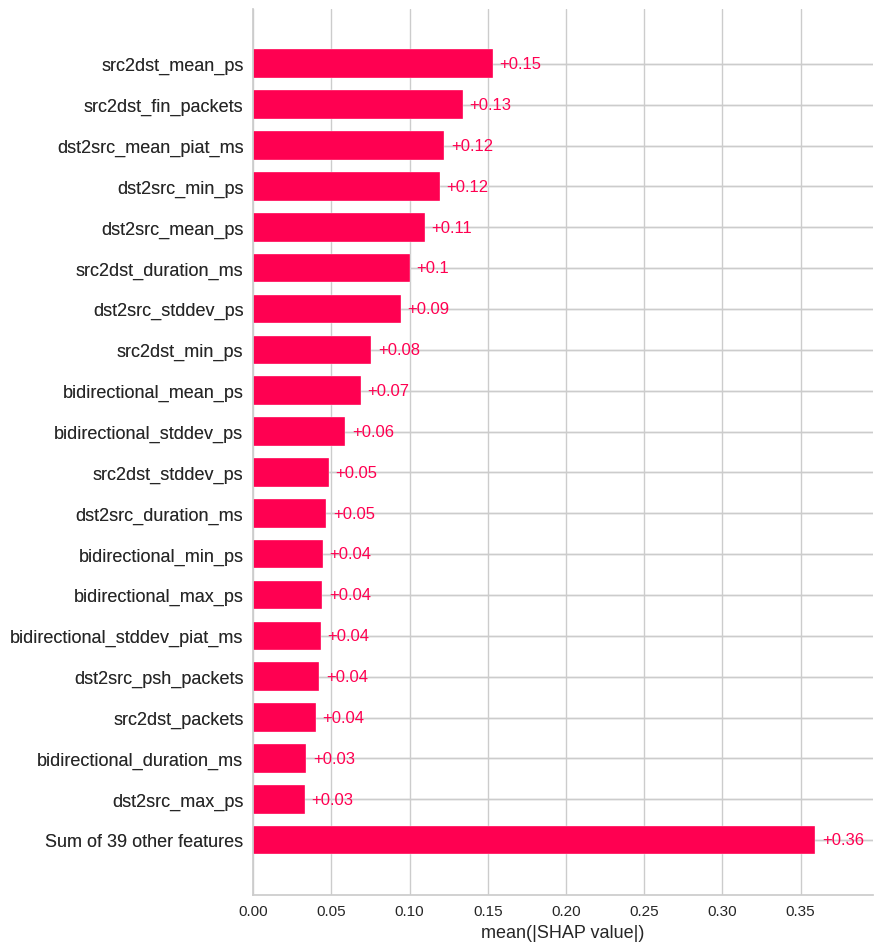

In [30]:
exp = Explanation(sv.values[:,:,3], 
                  sv.base_values[:,3], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

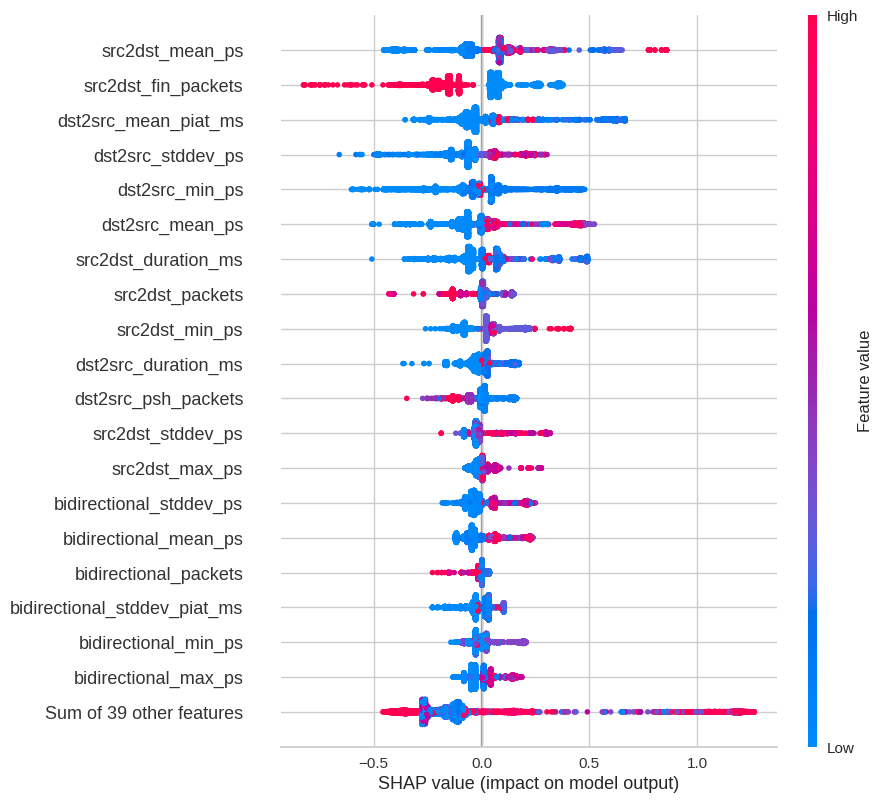

In [31]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

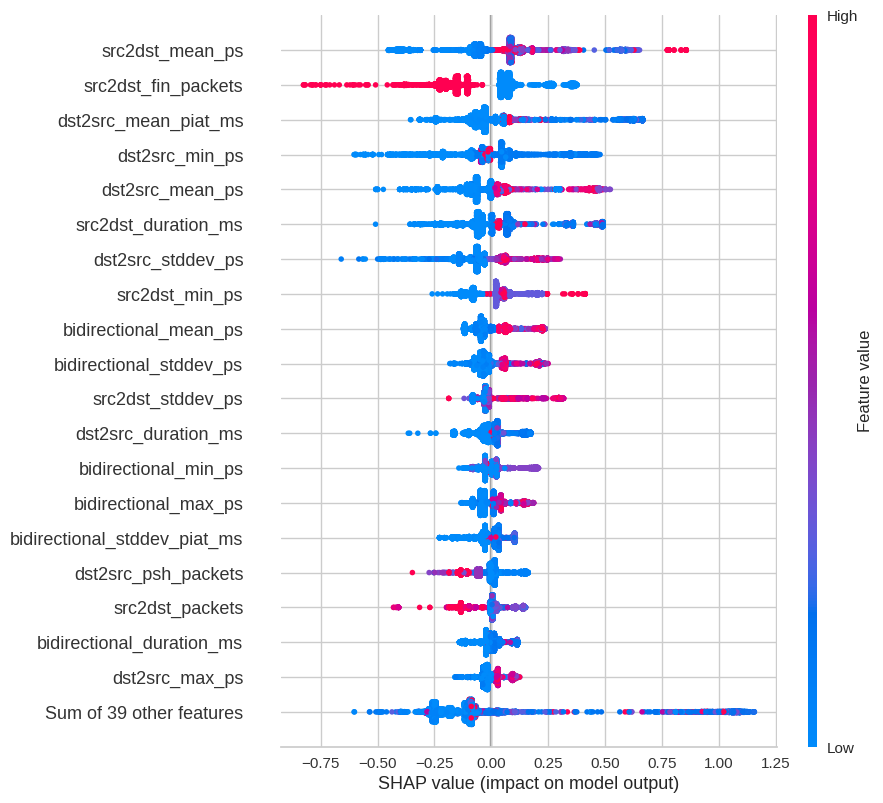

In [32]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## DoS Hulk shap

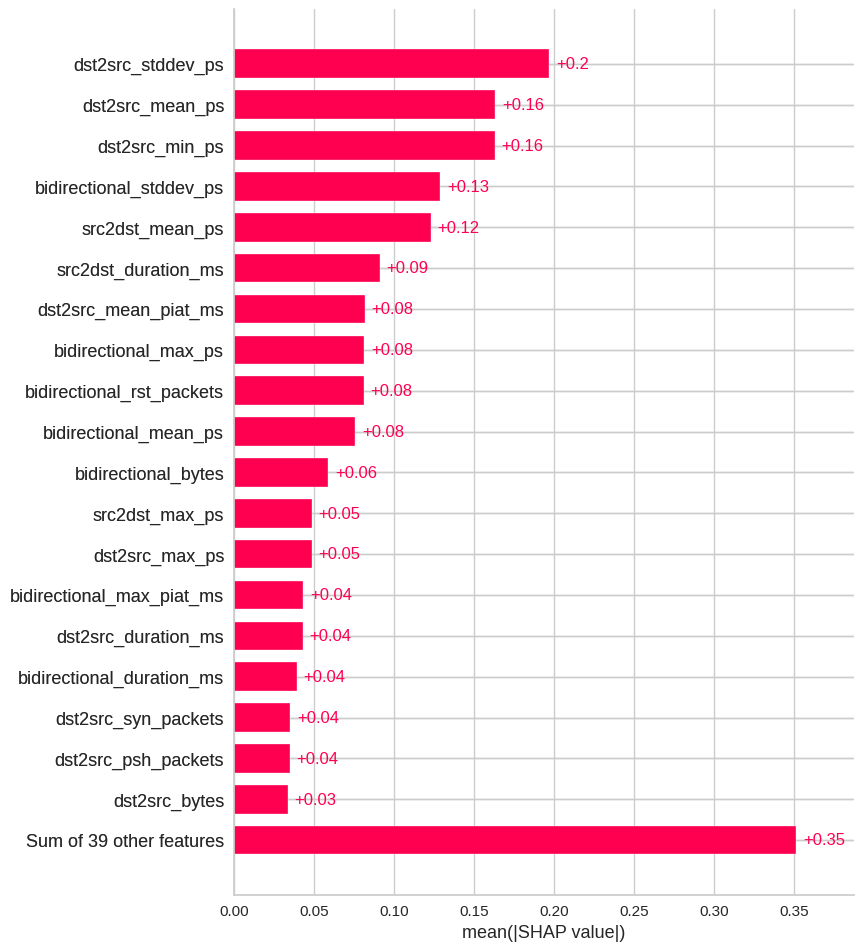

In [33]:
exp = Explanation(sv.values[:,:,4], 
                  sv.base_values[:,4], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

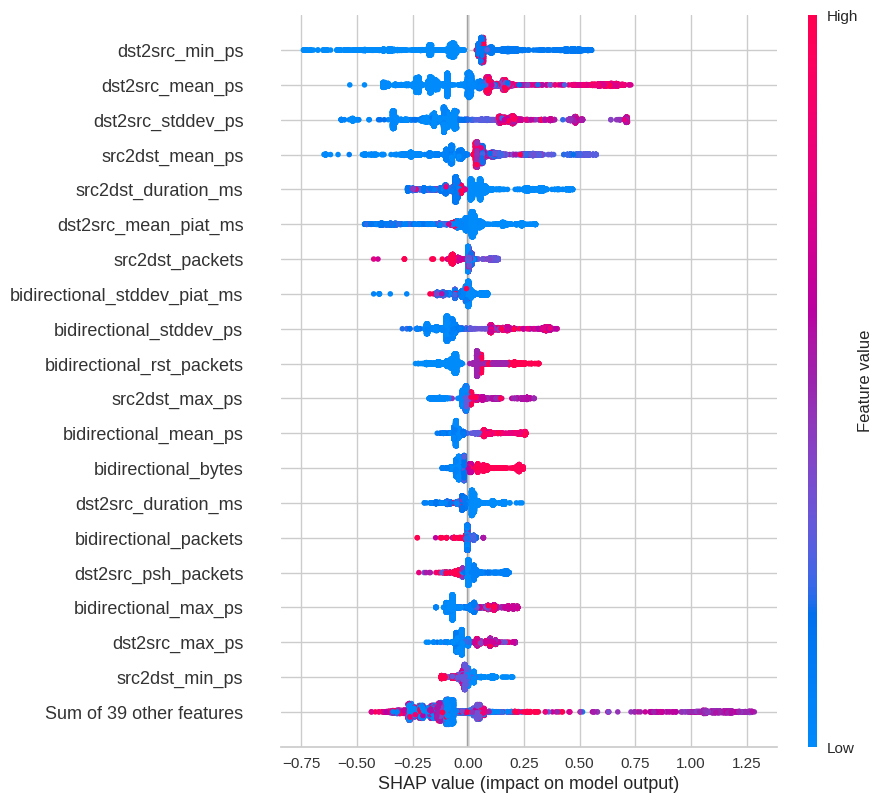

In [34]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

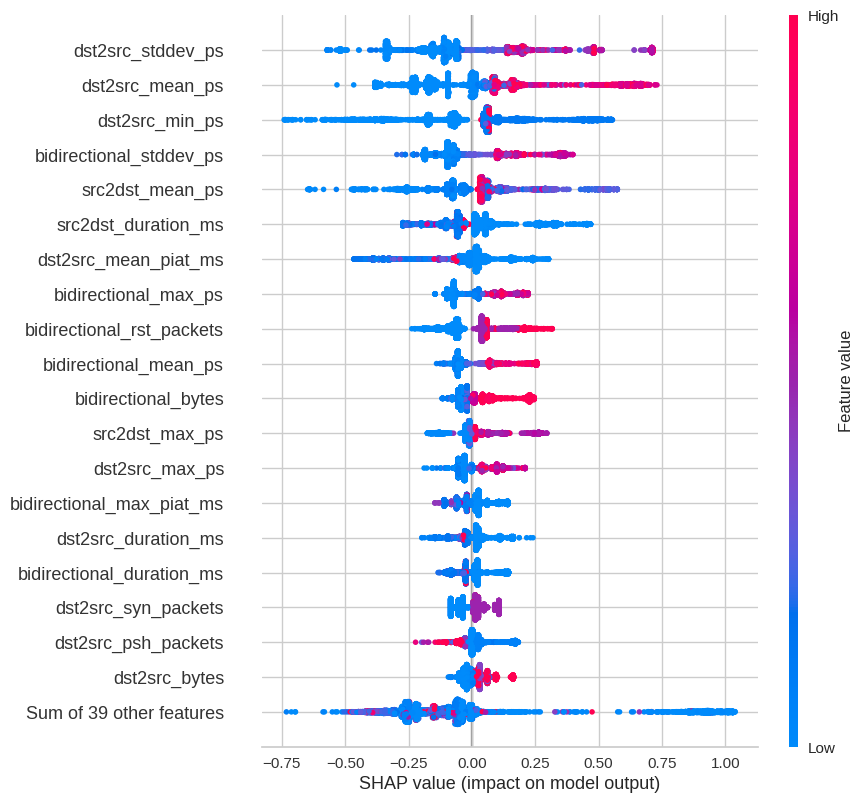

In [35]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## DoS Slowhttptest shap

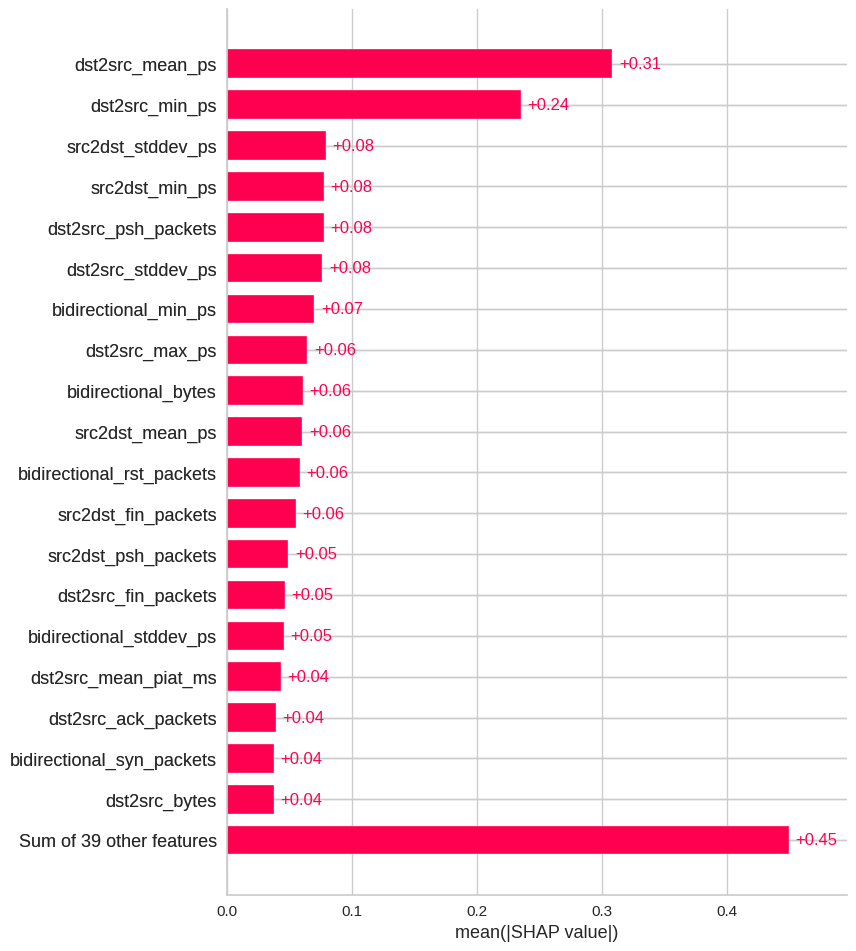

In [36]:
exp = Explanation(sv.values[:,:,5], 
                  sv.base_values[:,5], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

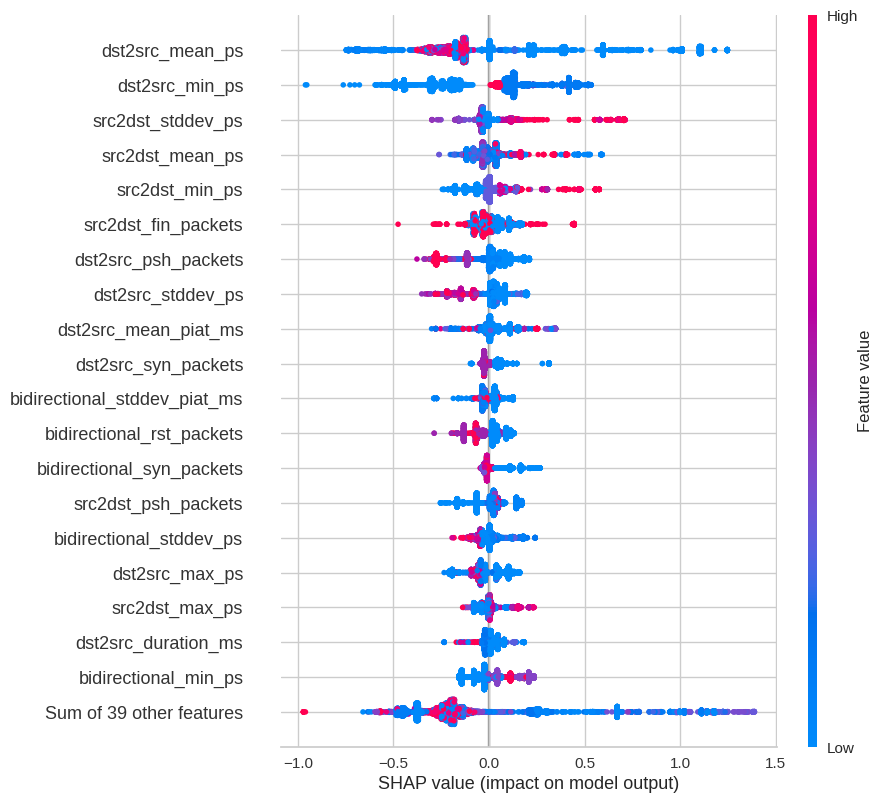

In [37]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

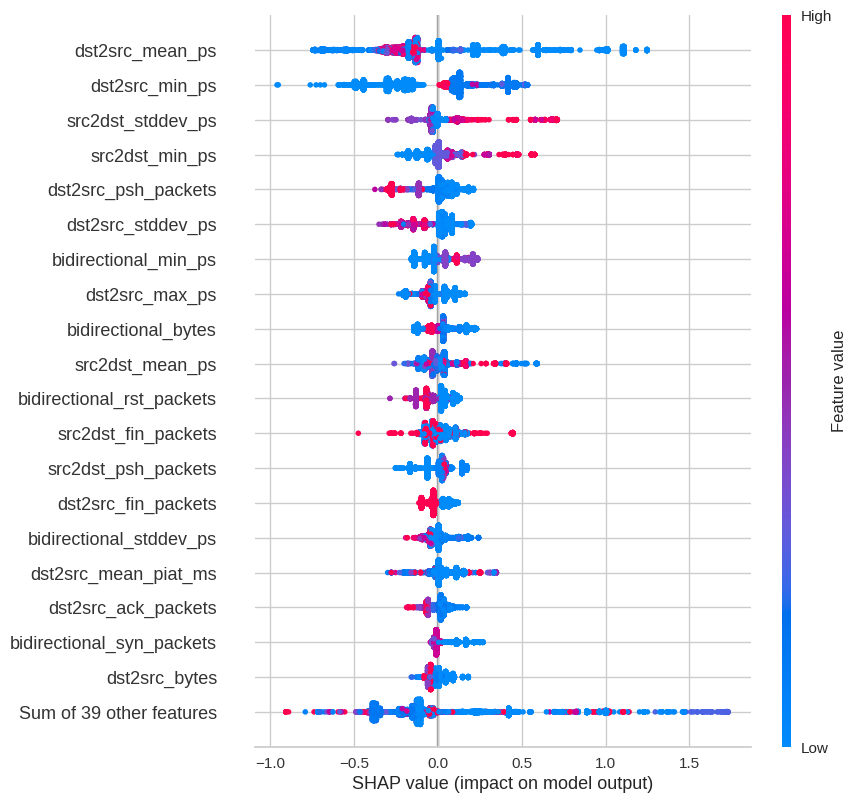

In [38]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## DoS slowloris shap

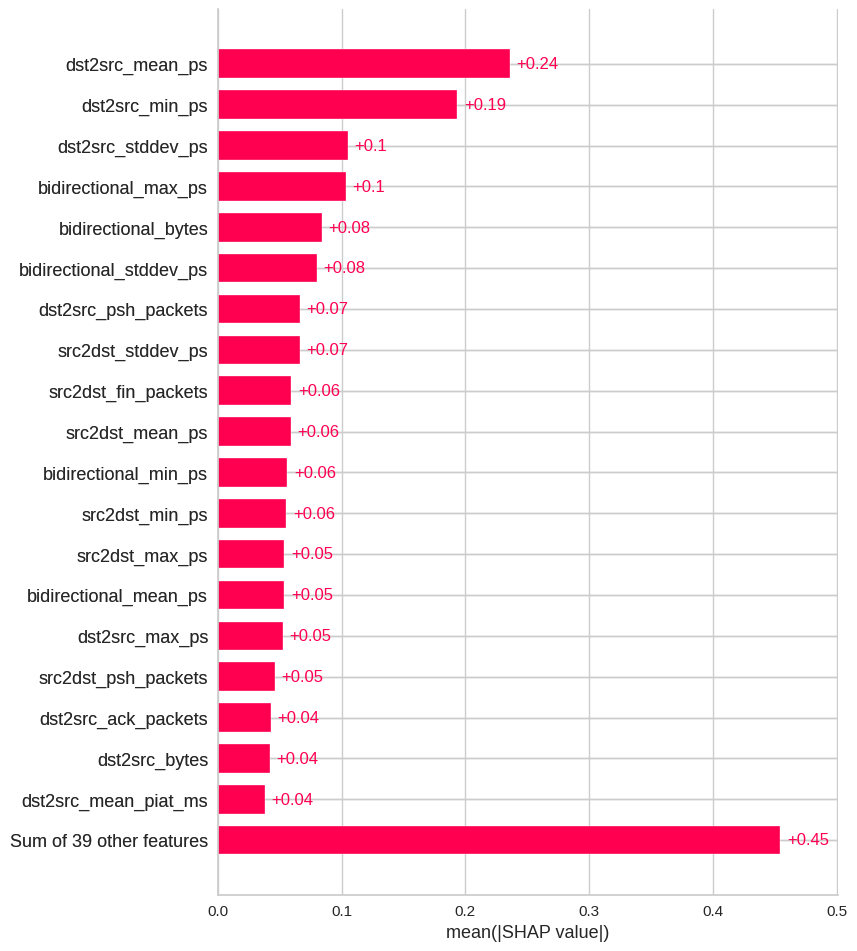

In [39]:
exp = Explanation(sv.values[:,:,6], 
                  sv.base_values[:,6], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

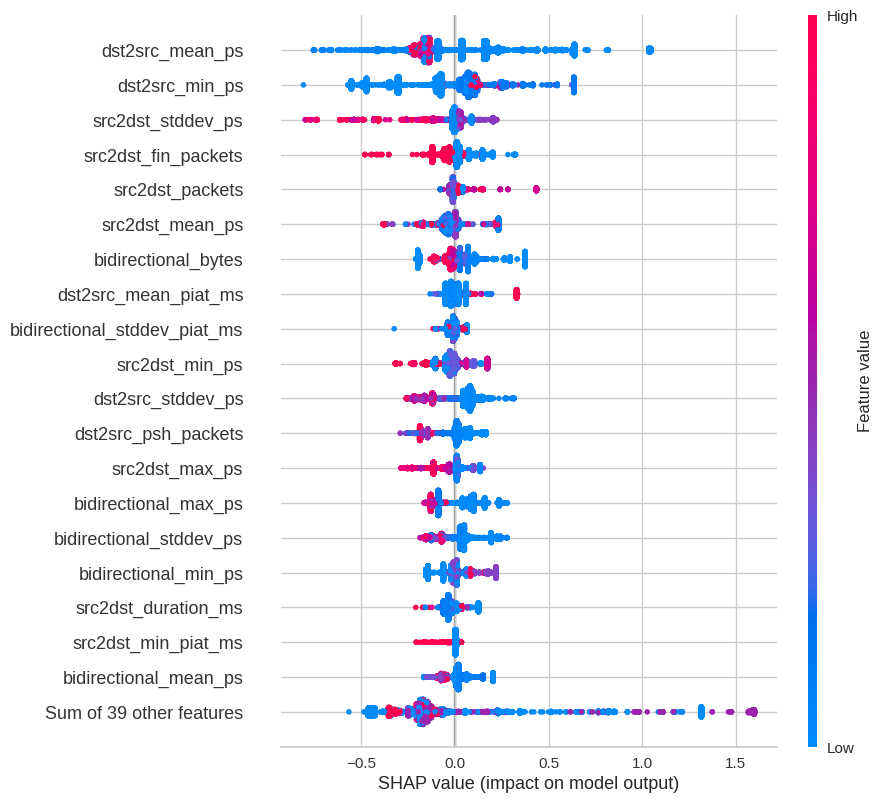

In [40]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

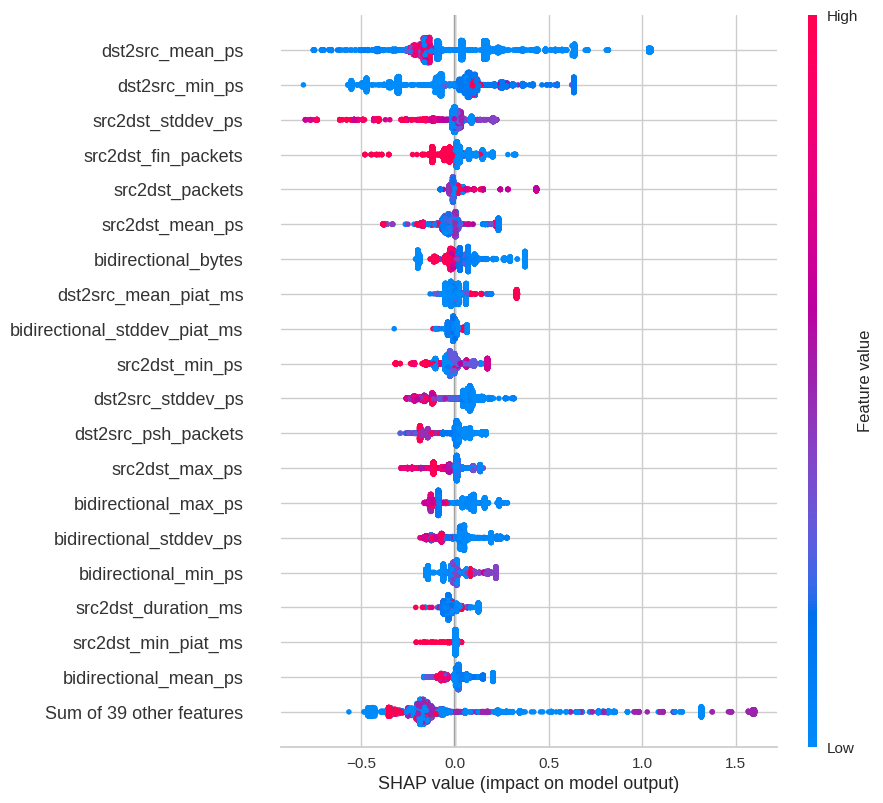

In [41]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

## FTP-Patator shap

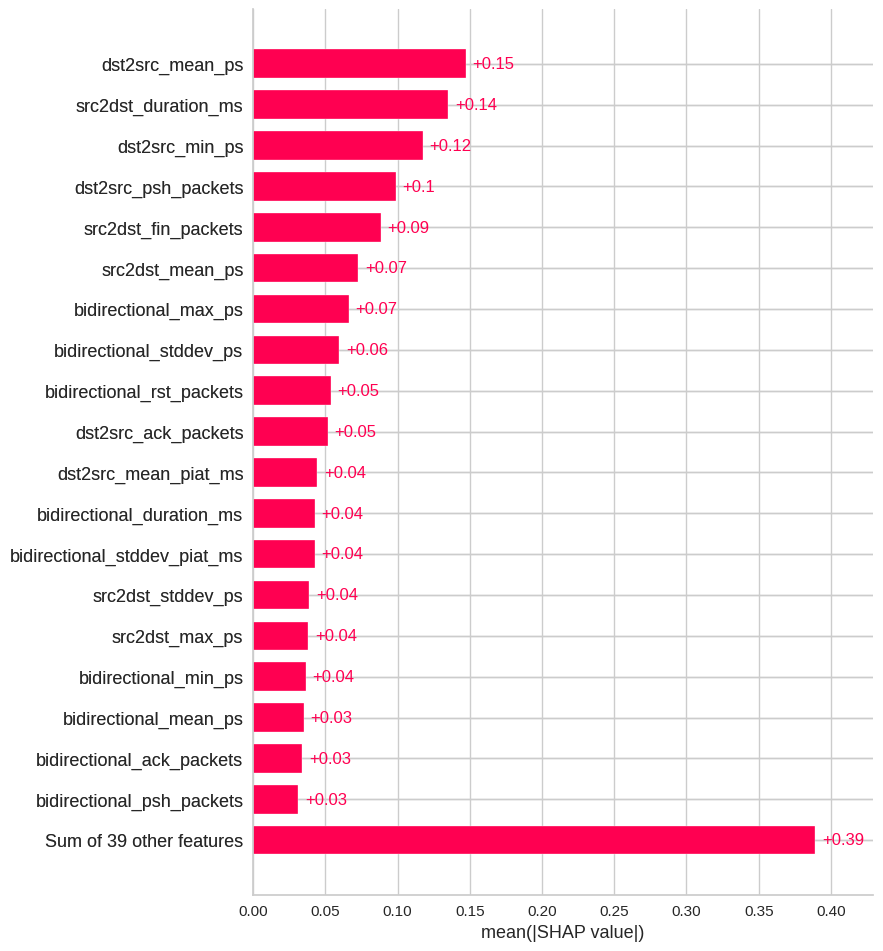

In [42]:
exp = Explanation(sv.values[:,:,7], 
                  sv.base_values[:,7], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

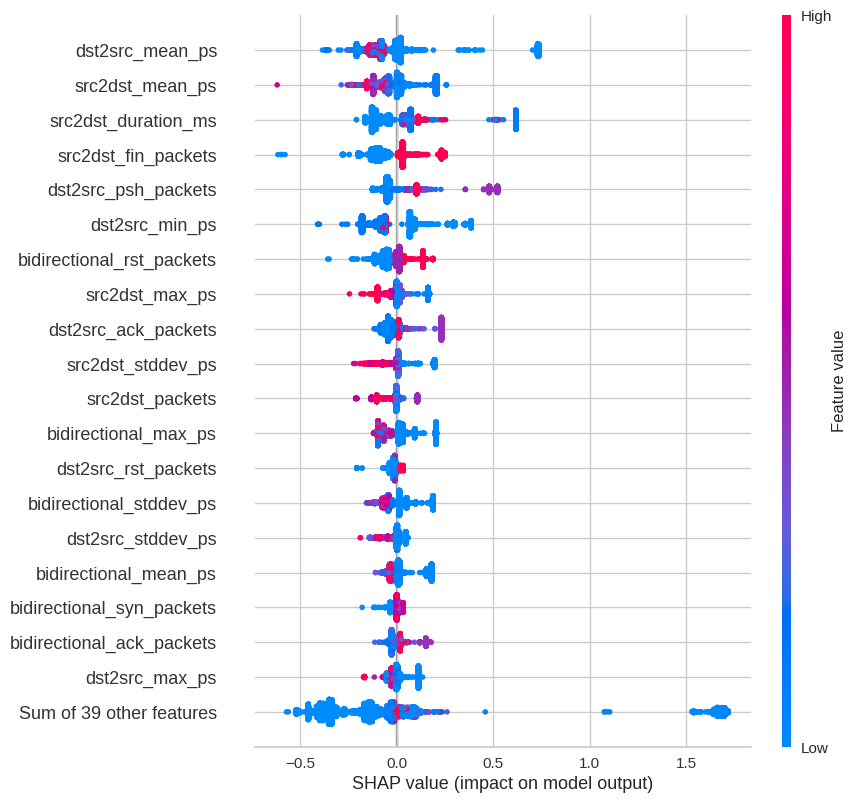

In [43]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

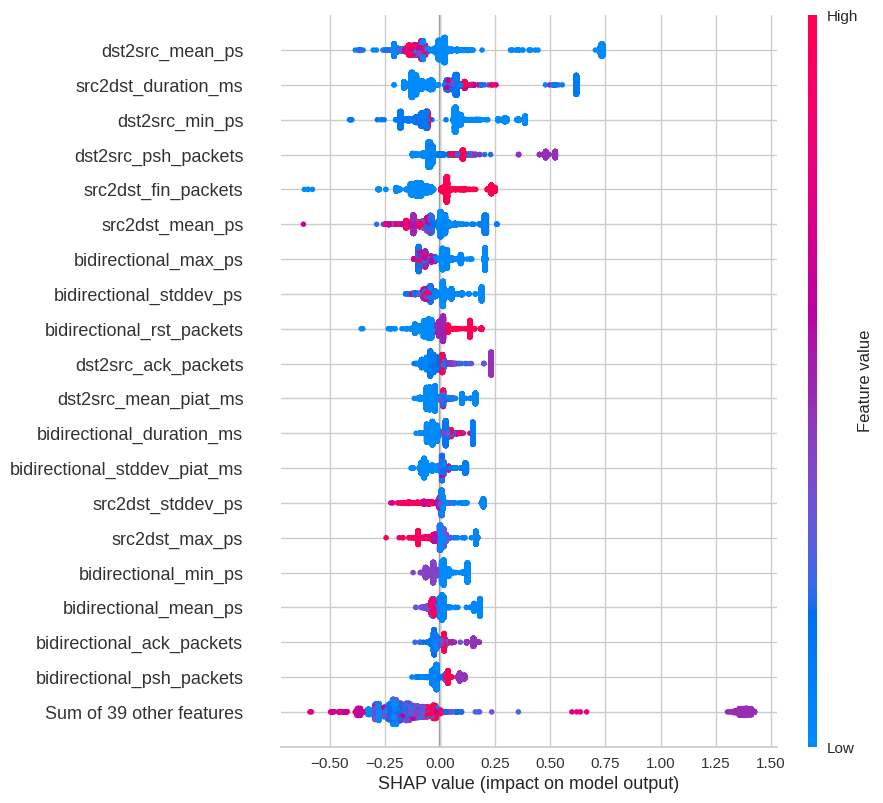

In [44]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Heartbleed shap

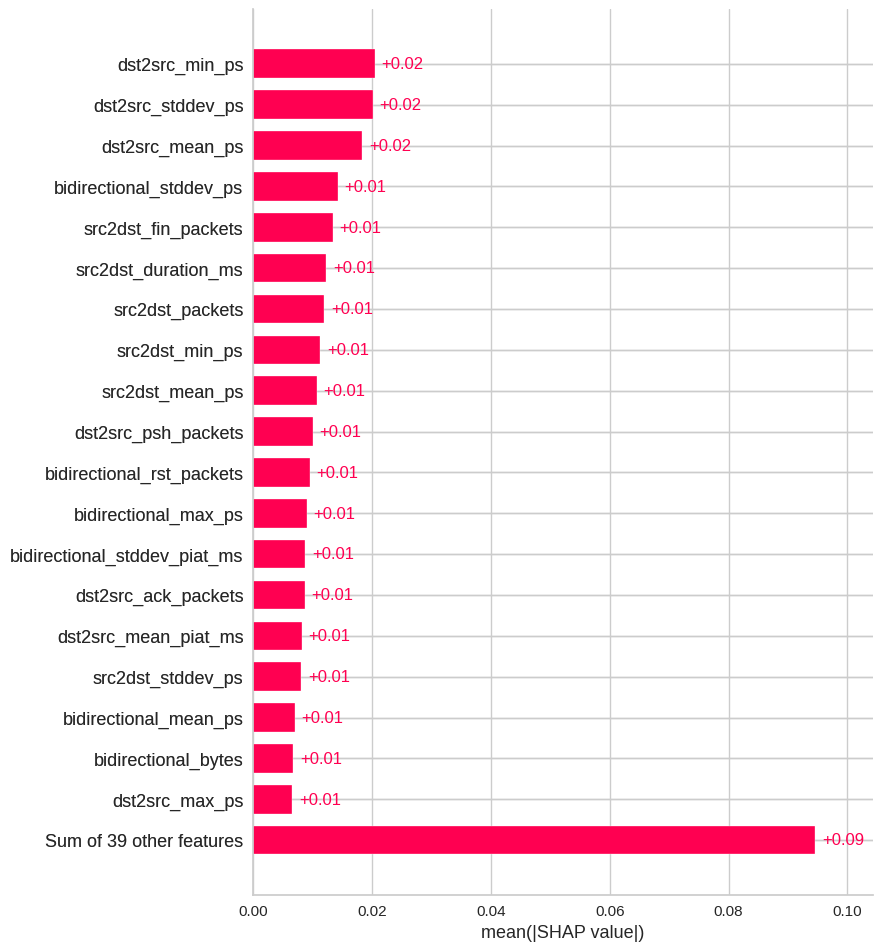

In [45]:
exp = Explanation(sv.values[:,:,8], 
                  sv.base_values[:,8], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

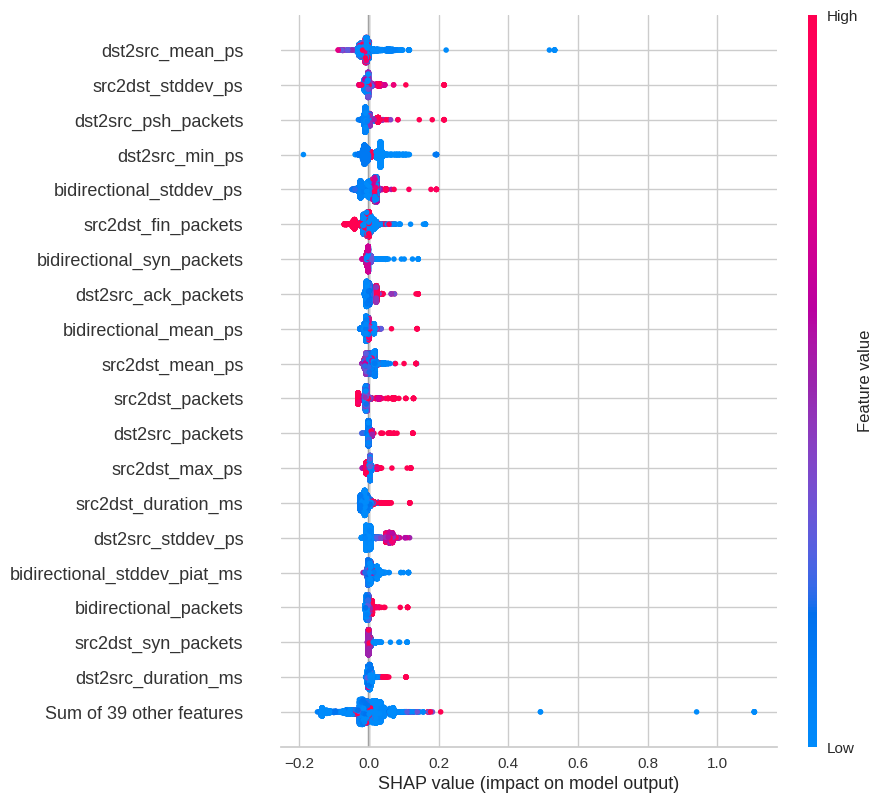

In [46]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

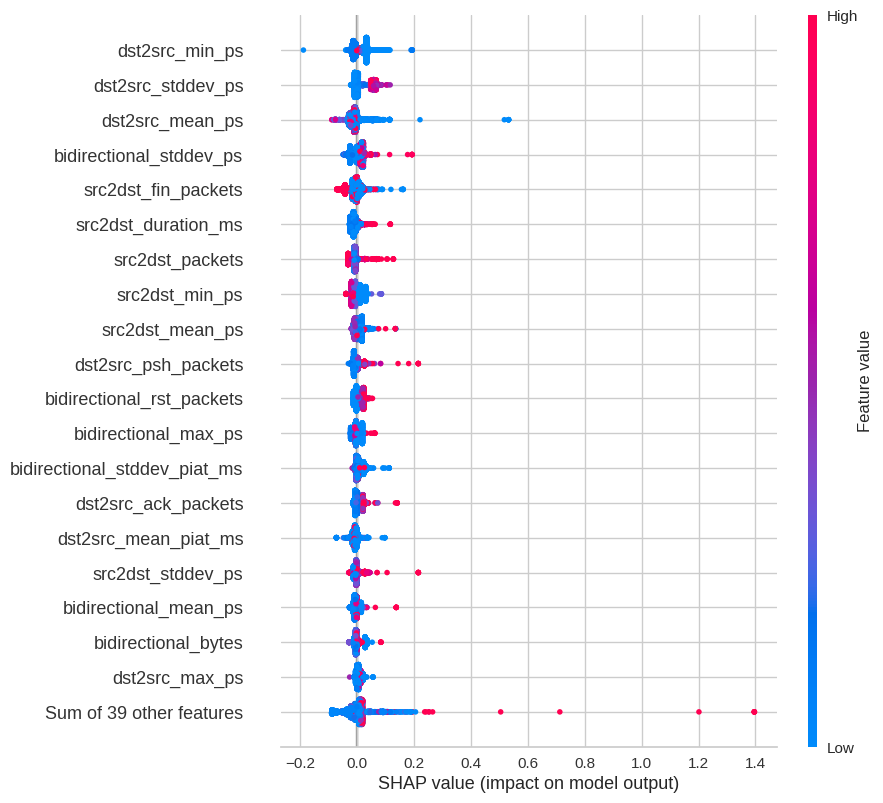

In [47]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Infiltration shap

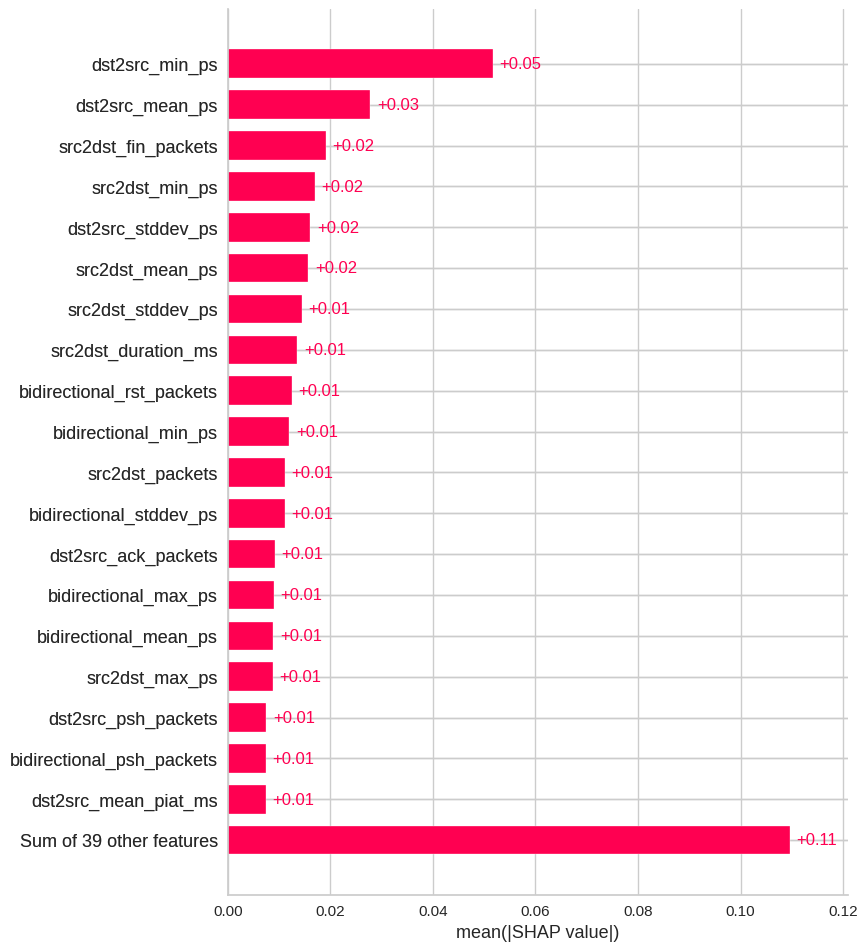

In [48]:
exp = Explanation(sv.values[:,:,9], 
                  sv.base_values[:,9], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

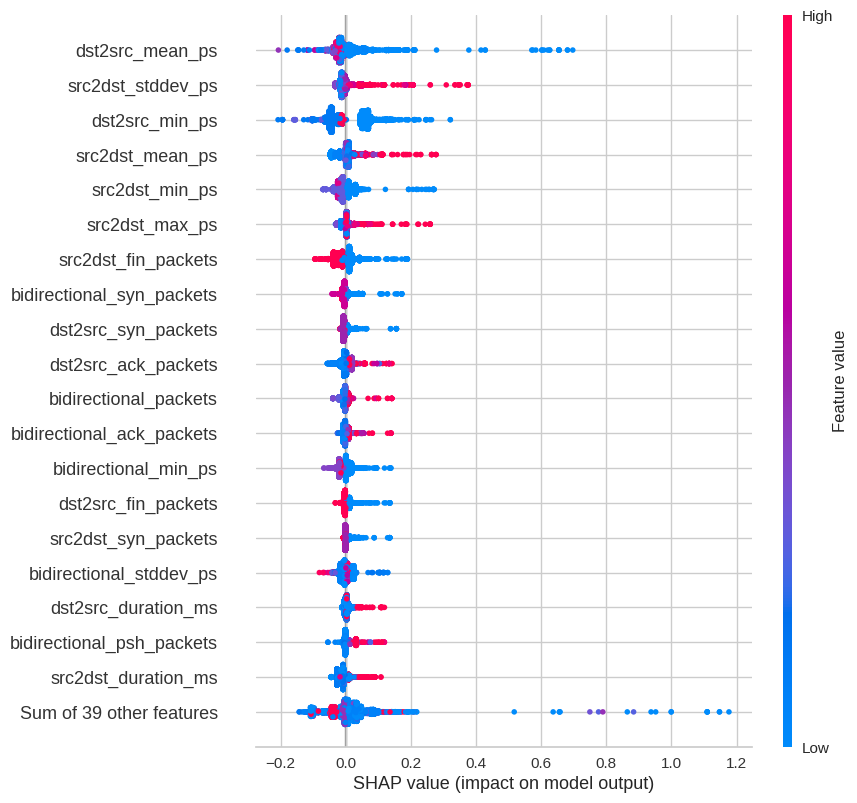

In [49]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

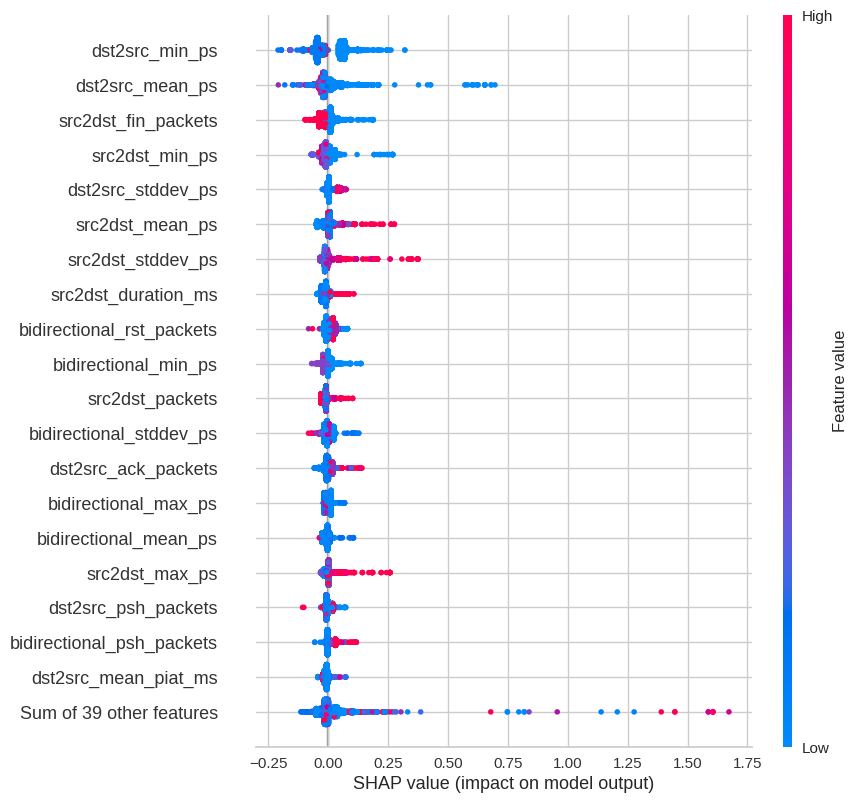

In [50]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## PortScan shap

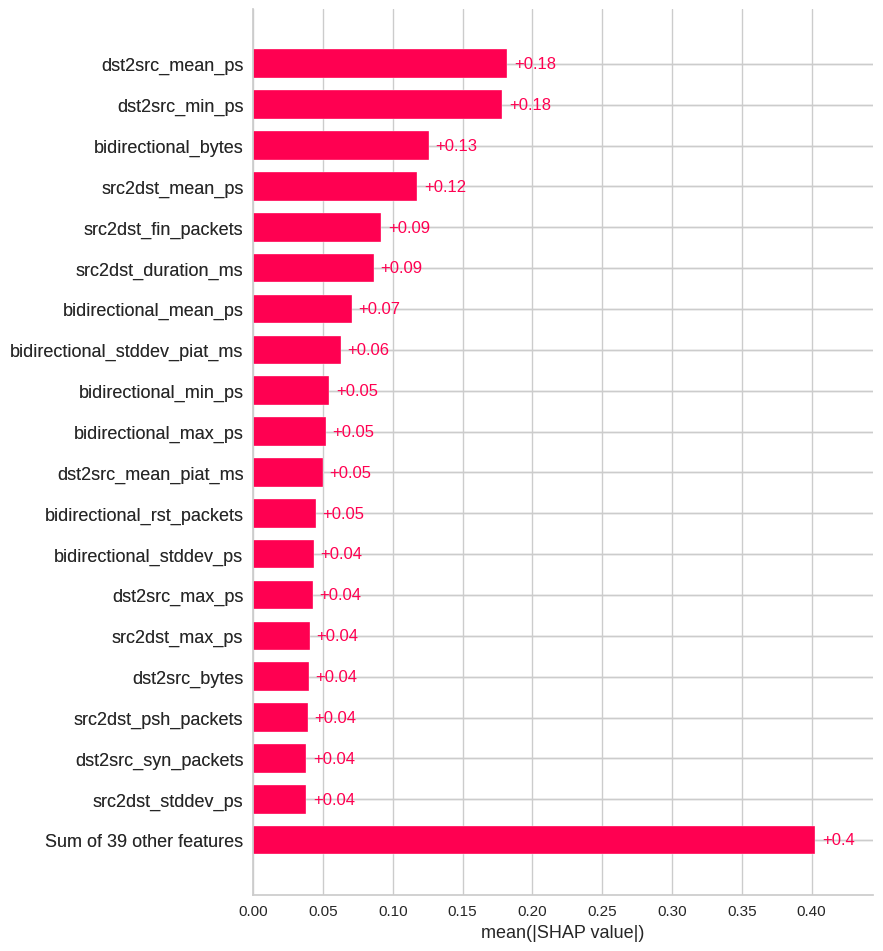

In [51]:
exp = Explanation(sv.values[:,:,10], 
                  sv.base_values[:,10], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

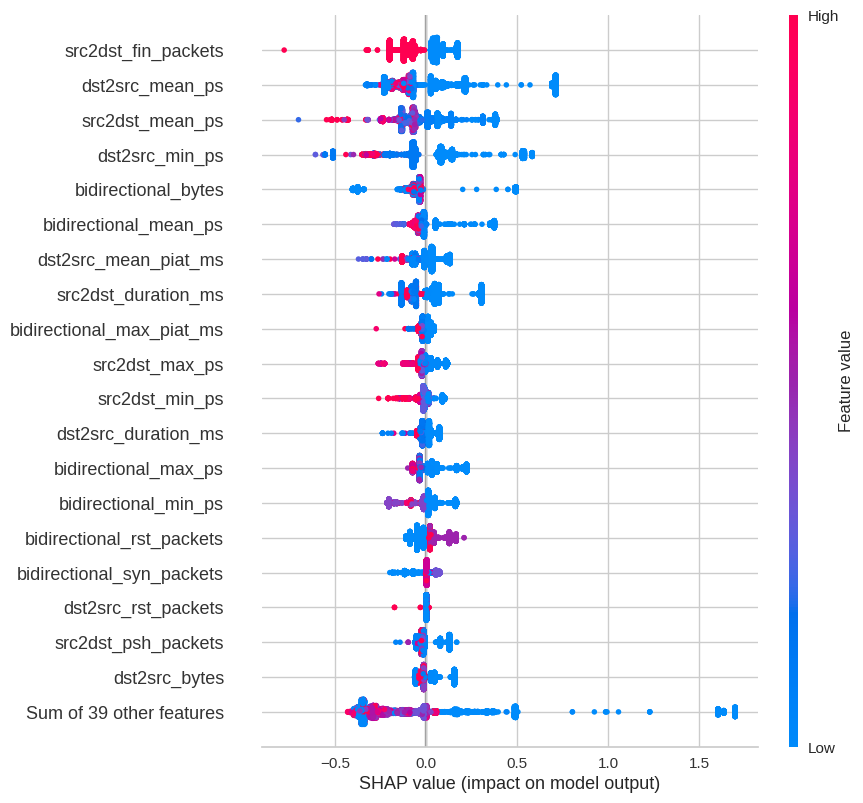

In [52]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

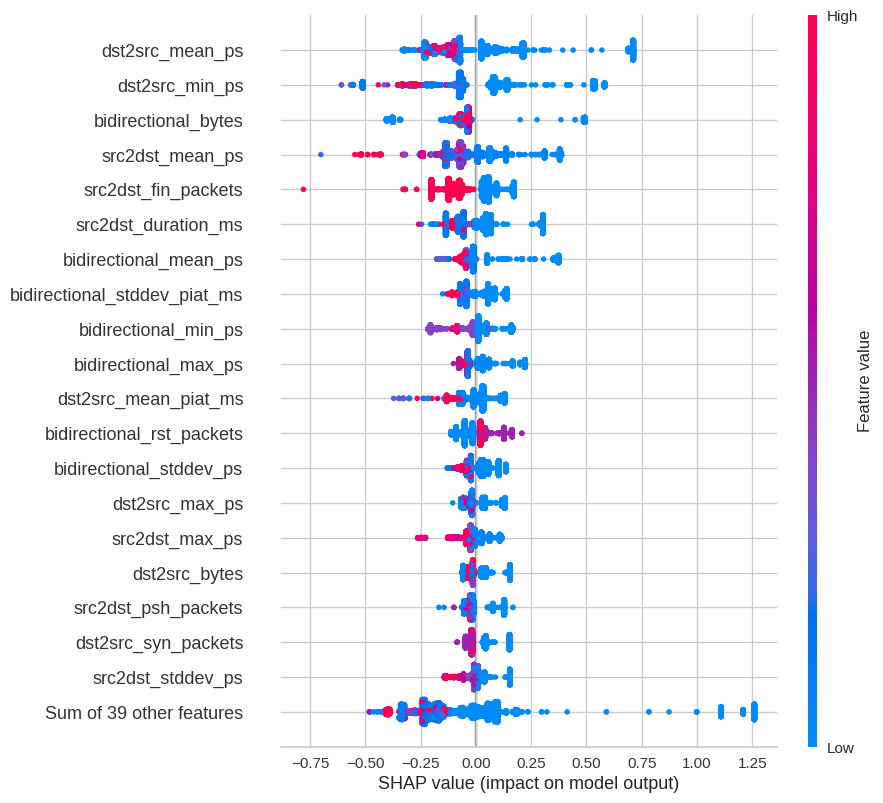

In [53]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## SSH-Patator shap

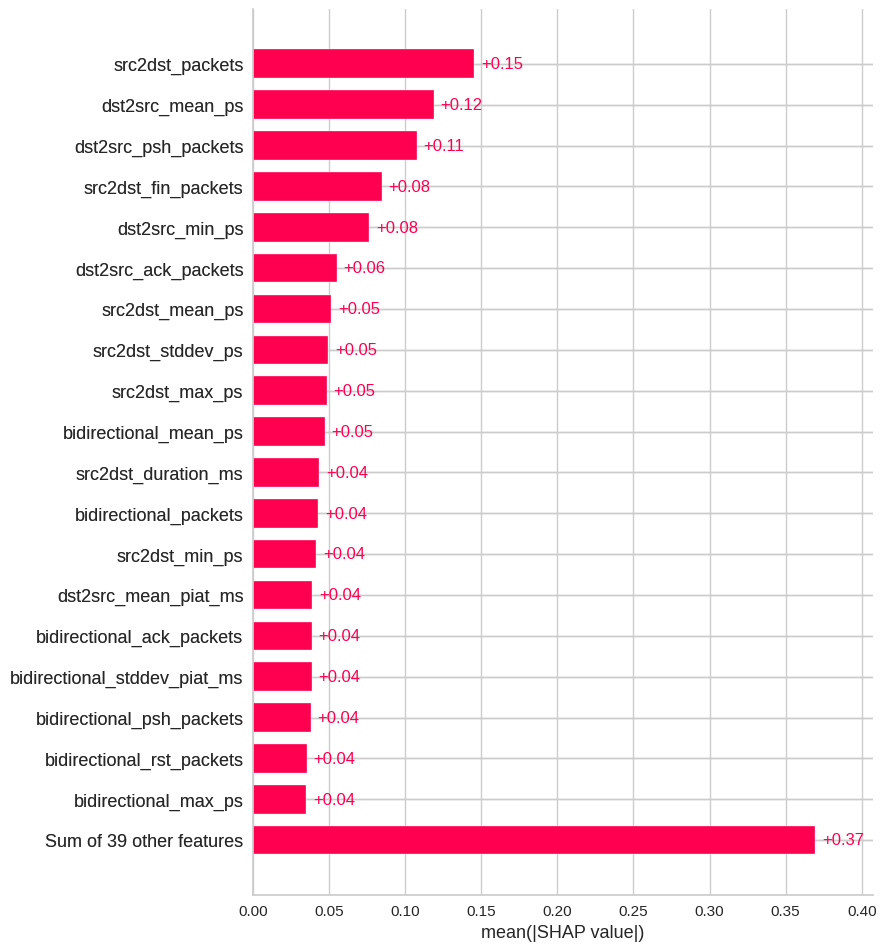

In [54]:
exp = Explanation(sv.values[:,:,11], 
                  sv.base_values[:,11], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

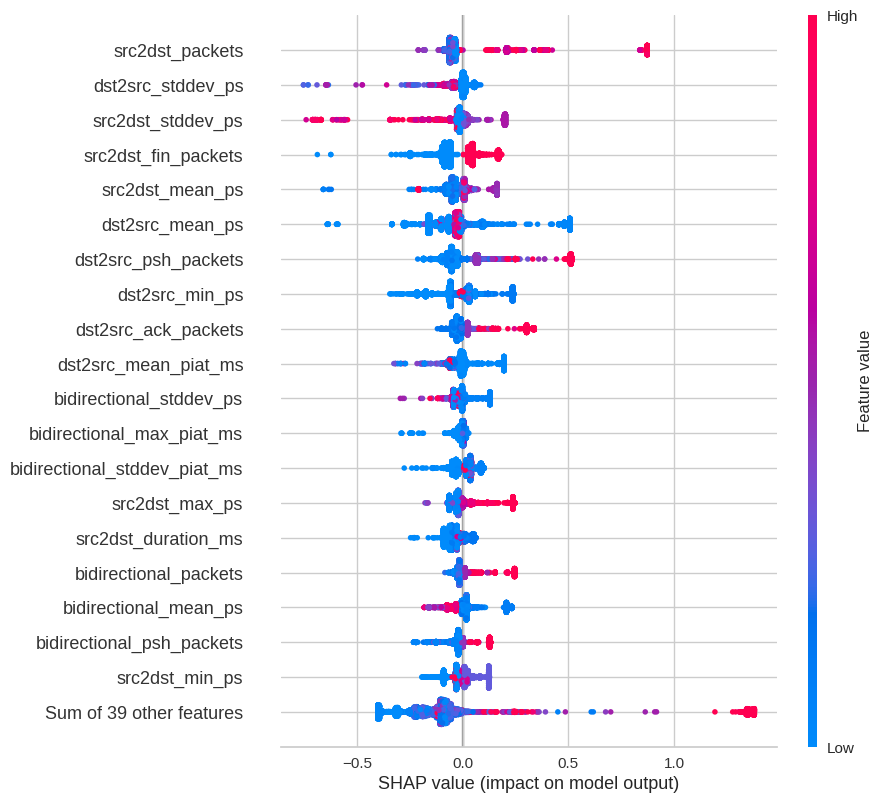

In [55]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

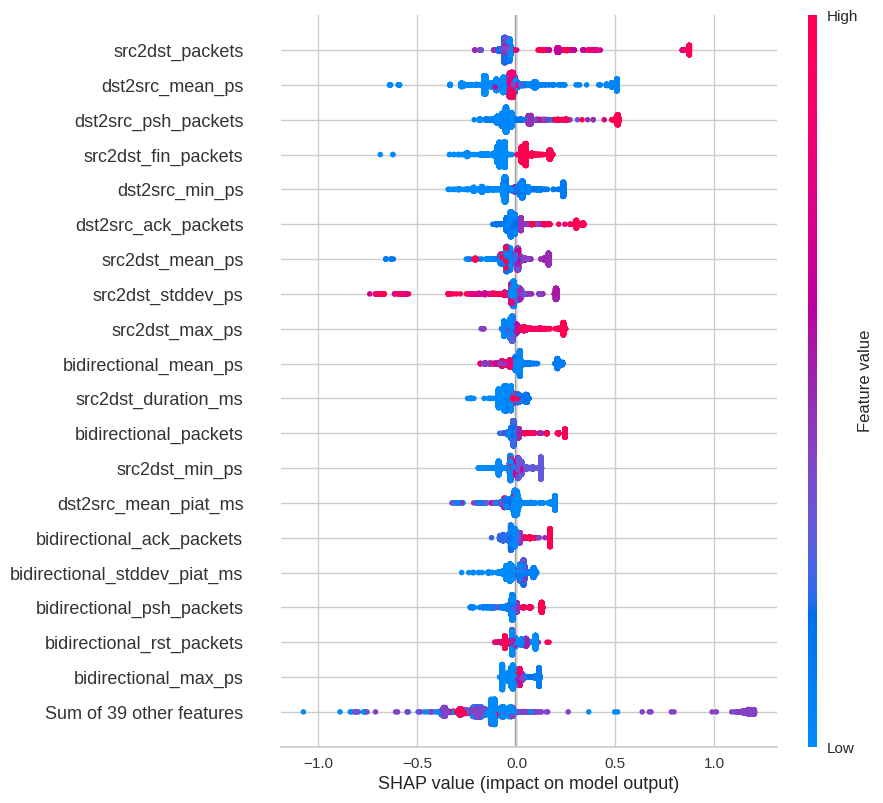

In [56]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Web Attack - Brute Force shap

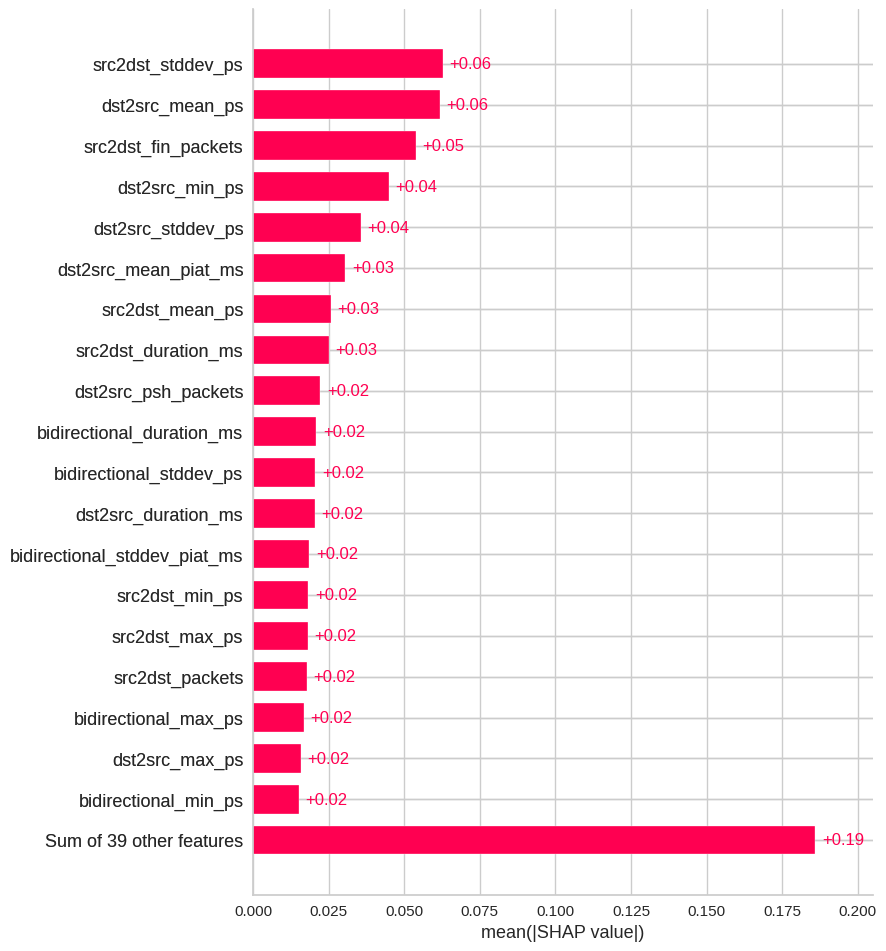

In [57]:
exp = Explanation(sv.values[:,:,12], 
                  sv.base_values[:,12], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

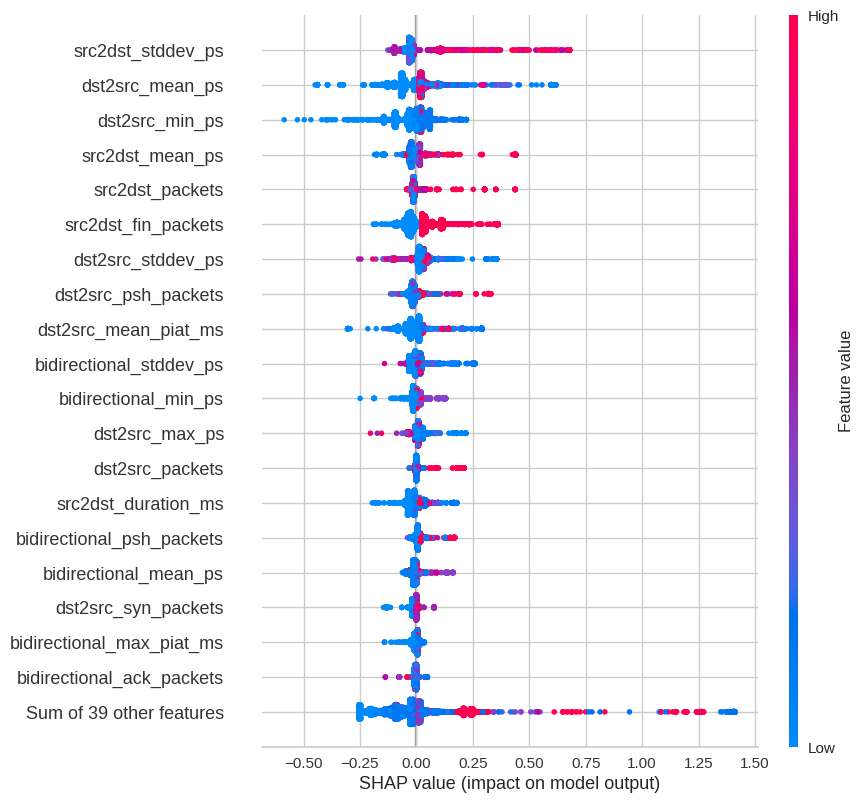

In [58]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

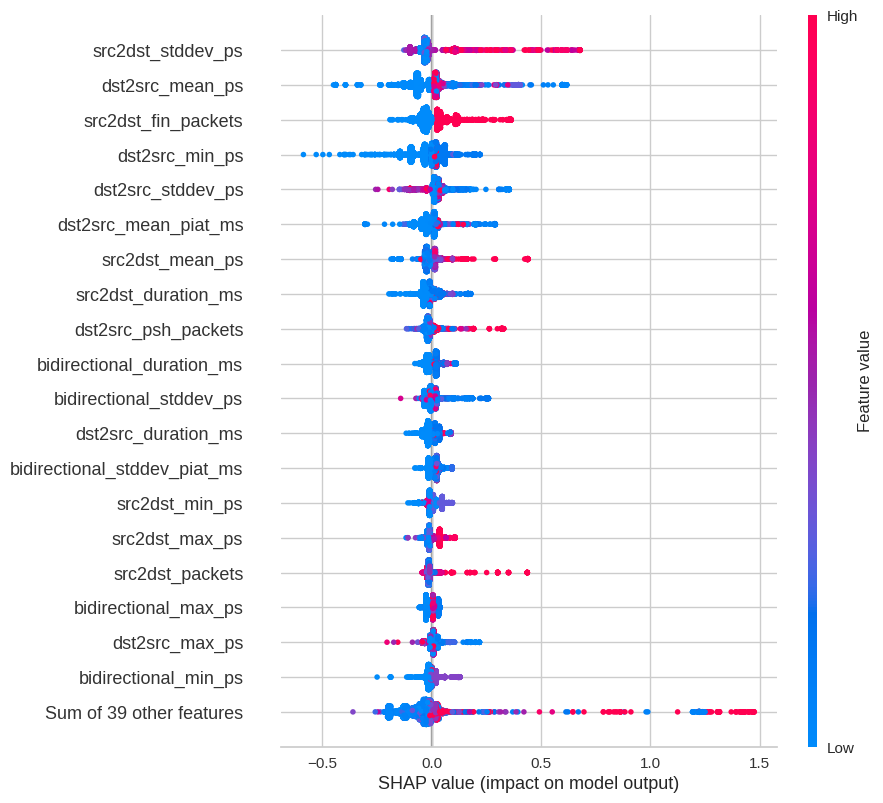

In [59]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Web Attack - Sql Injection shap

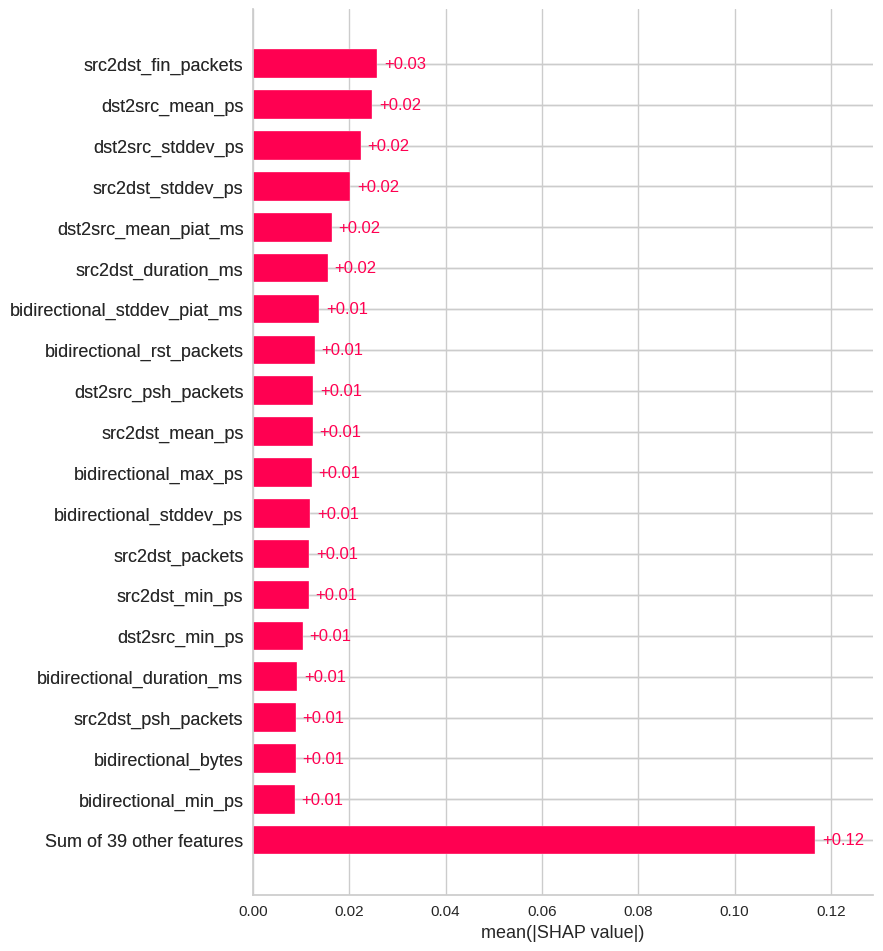

In [60]:
exp = Explanation(sv.values[:,:,13], 
                  sv.base_values[:,13], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

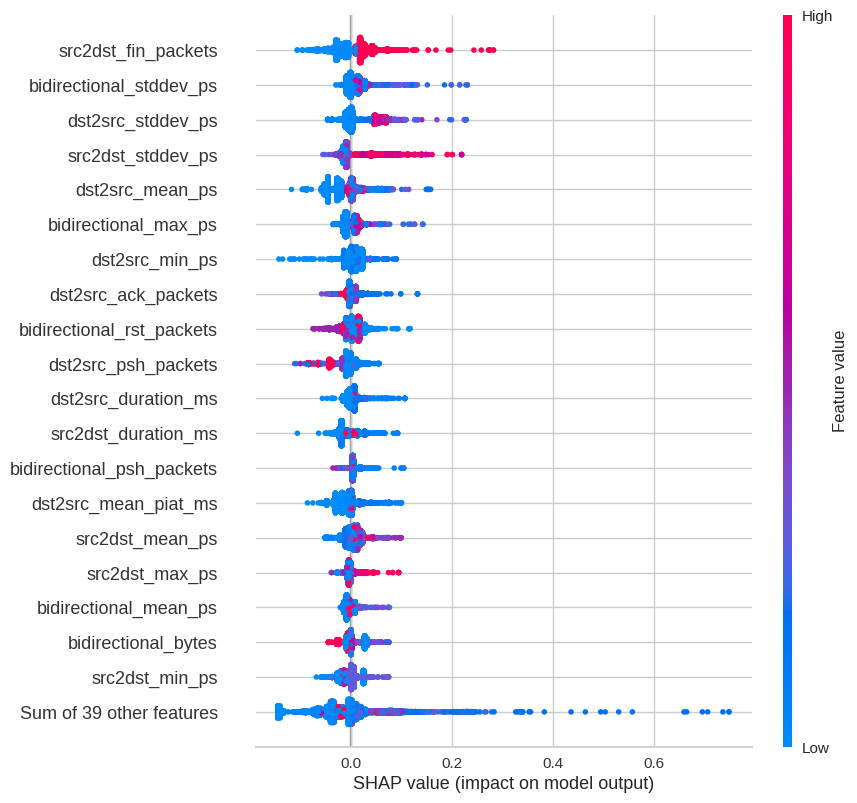

In [61]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

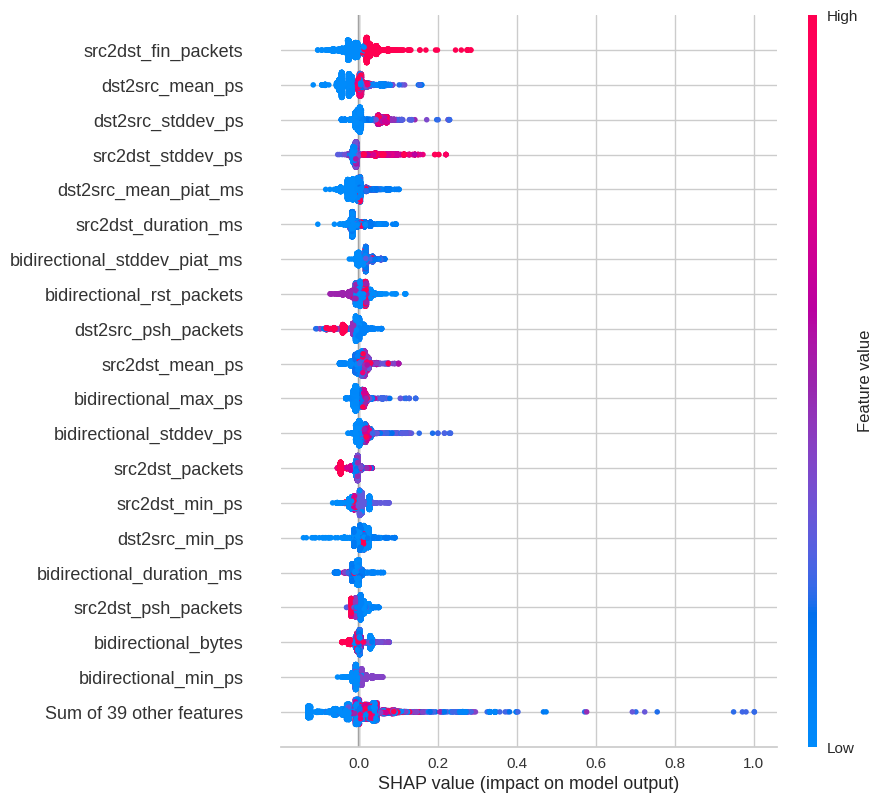

In [62]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Web Attack - XSS shap

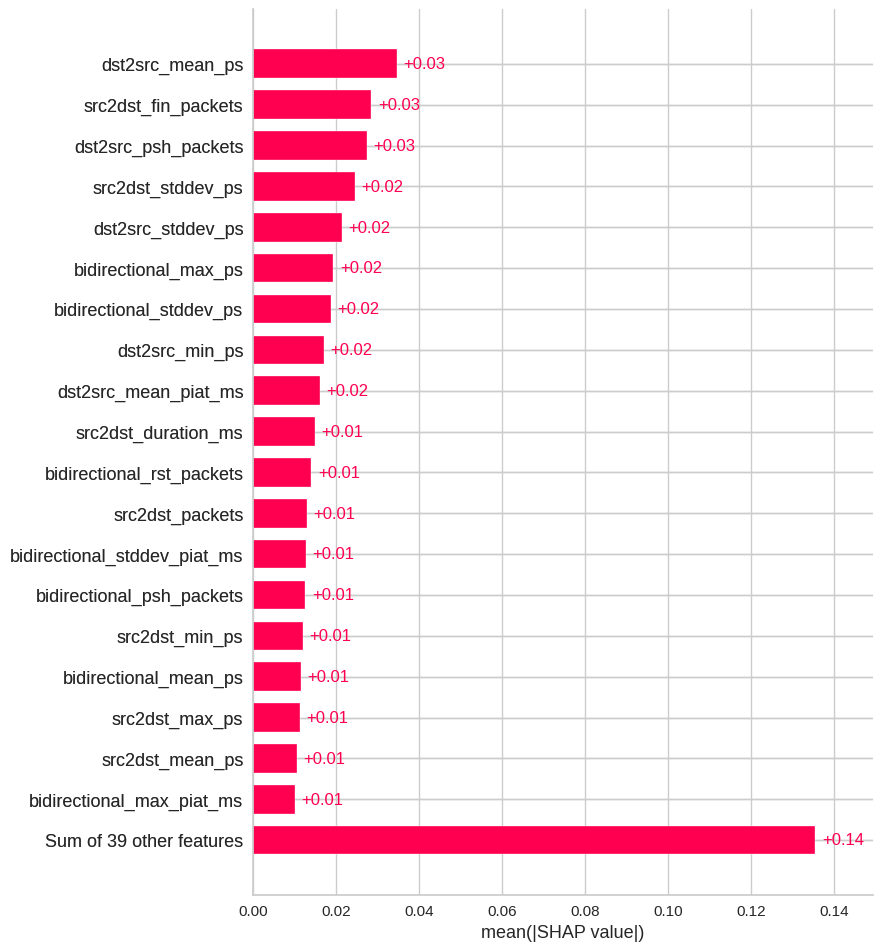

In [63]:
exp = Explanation(sv.values[:,:,14], 
                  sv.base_values[:,14], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

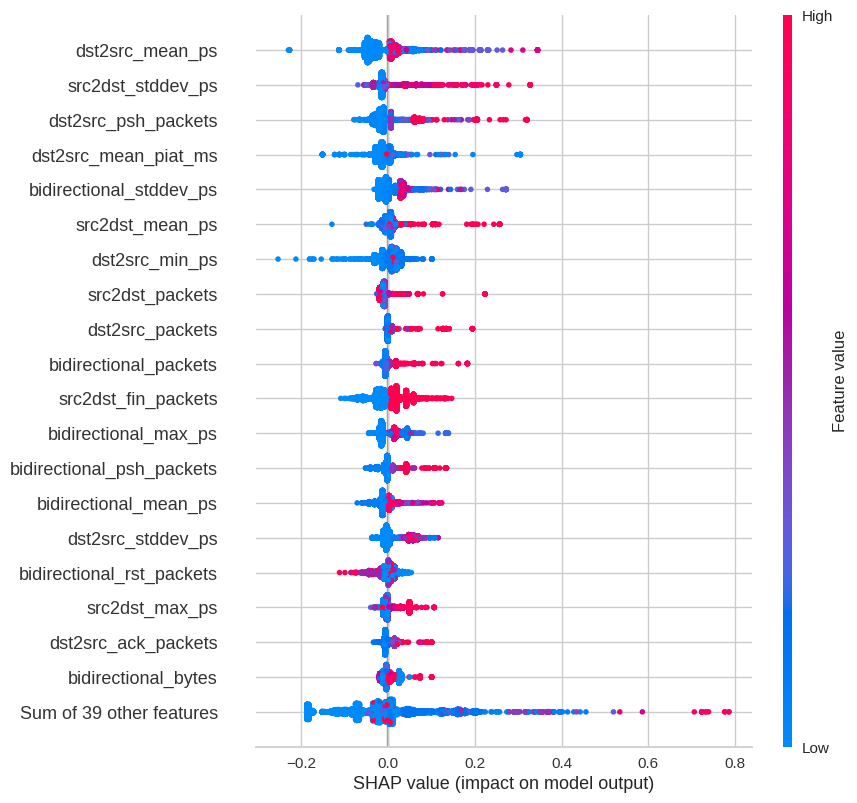

In [64]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

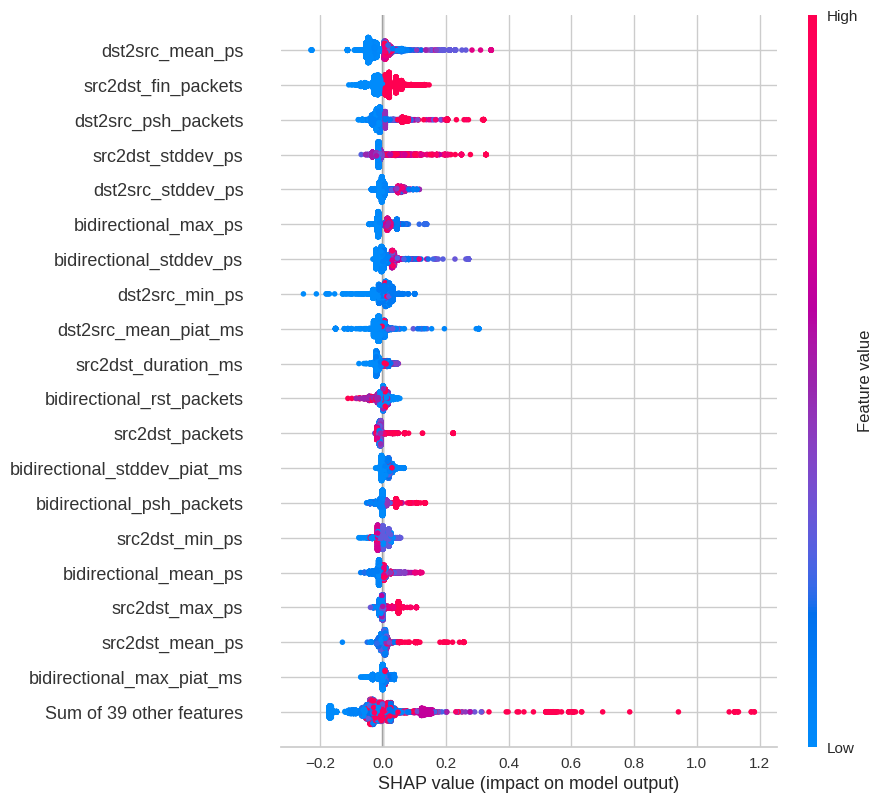

In [65]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Overall importance

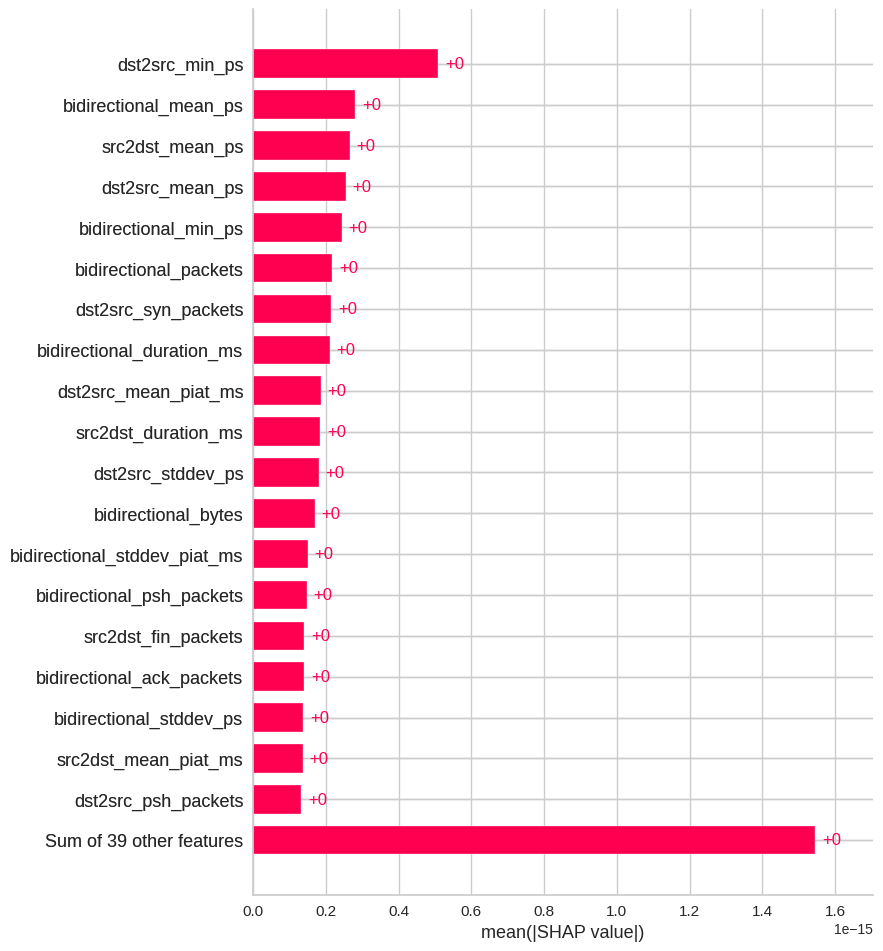

In [66]:
exp = Explanation(sv.values.mean(2), 
                  sv.base_values.mean(1), 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

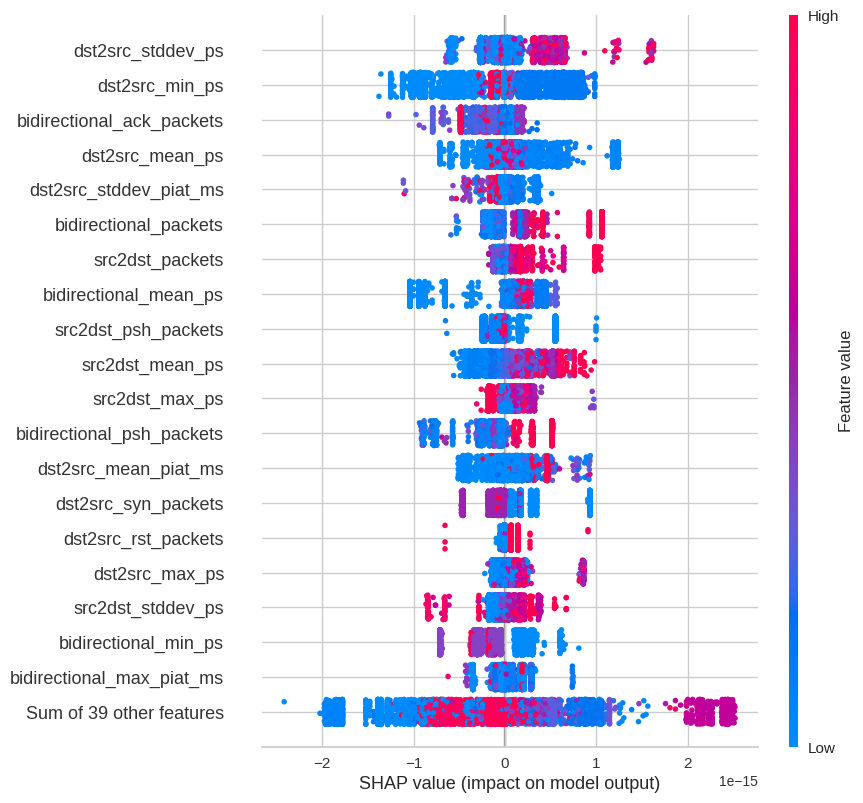

In [67]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

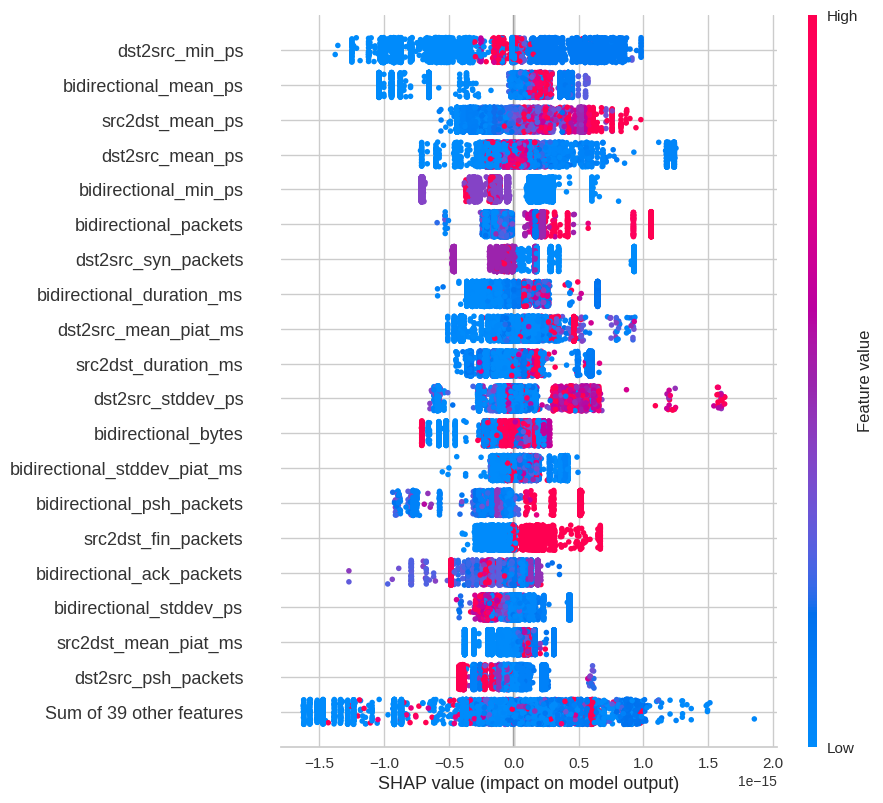

In [68]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Zero day test

In [69]:
classes = sorted(pd.unique(ds['label']).tolist())

In [70]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Bot']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.7620108	total: 340ms	remaining: 13.2s
1:	learn: 1.4406620	total: 682ms	remaining: 13s
2:	learn: 1.2245052	total: 1.01s	remaining: 12.4s
3:	learn: 1.0619607	total: 1.31s	remaining: 11.8s
4:	learn: 0.9280914	total: 1.66s	remaining: 11.7s
5:	learn: 0.8174811	total: 2s	remaining: 11.4s
6:	learn: 0.7301403	total: 2.34s	remaining: 11s
7:	learn: 0.6589985	total: 2.69s	remaining: 10.8s
8:	learn: 0.5948805	total: 3.03s	remaining: 10.4s
9:	learn: 0.5396504	total: 3.42s	remaining: 10.3s
10:	learn: 0.4900561	total: 3.77s	remaining: 9.94s
11:	learn: 0.4493252	total: 4.12s	remaining: 9.62s
12:	learn: 0.4120708	total: 4.44s	remaining: 9.22s
13:	learn: 0.3776060	total: 4.76s	remaining: 8.85s
14:	learn: 0.3501631	total: 5.1s	remaining: 8.5s
15:	learn: 0.3243140	total: 5.47s	remaining: 8.21s
16:	learn: 0.3018188	total: 5.79s	remaining: 7.84s
17:	learn: 0.2812825	total: 6.17s	remaining: 7.54s
18:	learn: 0.2618722	total: 6.52s	remaining: 7.21s
19:	learn: 0.2446495	total: 6.88s	remaining: 6.88s

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.990902,0.885020
1,PRECISION,0.990998,0.832925
2,RECALL,0.990902,0.885020
3,F1 SCORE,0.990828,0.851123


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


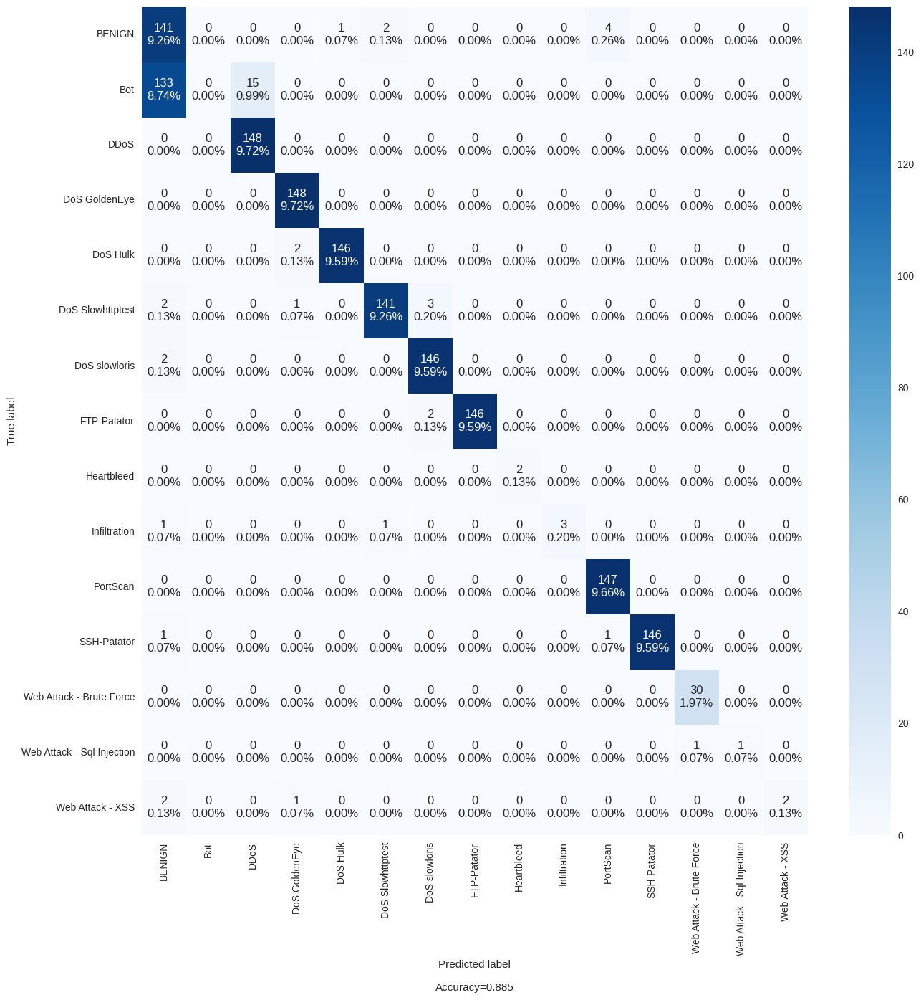

In [71]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [72]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DDoS']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.7485091	total: 460ms	remaining: 17.9s
1:	learn: 1.4252849	total: 788ms	remaining: 15s
2:	learn: 1.1953044	total: 1.19s	remaining: 14.6s
3:	learn: 1.0342678	total: 1.6s	remaining: 14.4s
4:	learn: 0.9063693	total: 2.03s	remaining: 14.2s
5:	learn: 0.8049506	total: 2.37s	remaining: 13.4s
6:	learn: 0.7170437	total: 2.72s	remaining: 12.8s
7:	learn: 0.6458326	total: 3.06s	remaining: 12.2s
8:	learn: 0.5837510	total: 3.39s	remaining: 11.7s
9:	learn: 0.5296461	total: 3.74s	remaining: 11.2s
10:	learn: 0.4836807	total: 4.03s	remaining: 10.6s
11:	learn: 0.4428600	total: 4.31s	remaining: 10.1s
12:	learn: 0.4050873	total: 4.56s	remaining: 9.48s
13:	learn: 0.3725005	total: 4.83s	remaining: 8.97s
14:	learn: 0.3425097	total: 5.07s	remaining: 8.46s
15:	learn: 0.3181490	total: 5.34s	remaining: 8.02s
16:	learn: 0.2959496	total: 5.6s	remaining: 7.58s
17:	learn: 0.2763156	total: 5.86s	remaining: 7.16s
18:	learn: 0.2582483	total: 6.12s	remaining: 6.76s
19:	learn: 0.2401637	total: 6.39s	remaining: 

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.990721,0.886991
1,PRECISION,0.990793,0.835915
2,RECALL,0.990721,0.886991
3,F1 SCORE,0.990673,0.853126


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


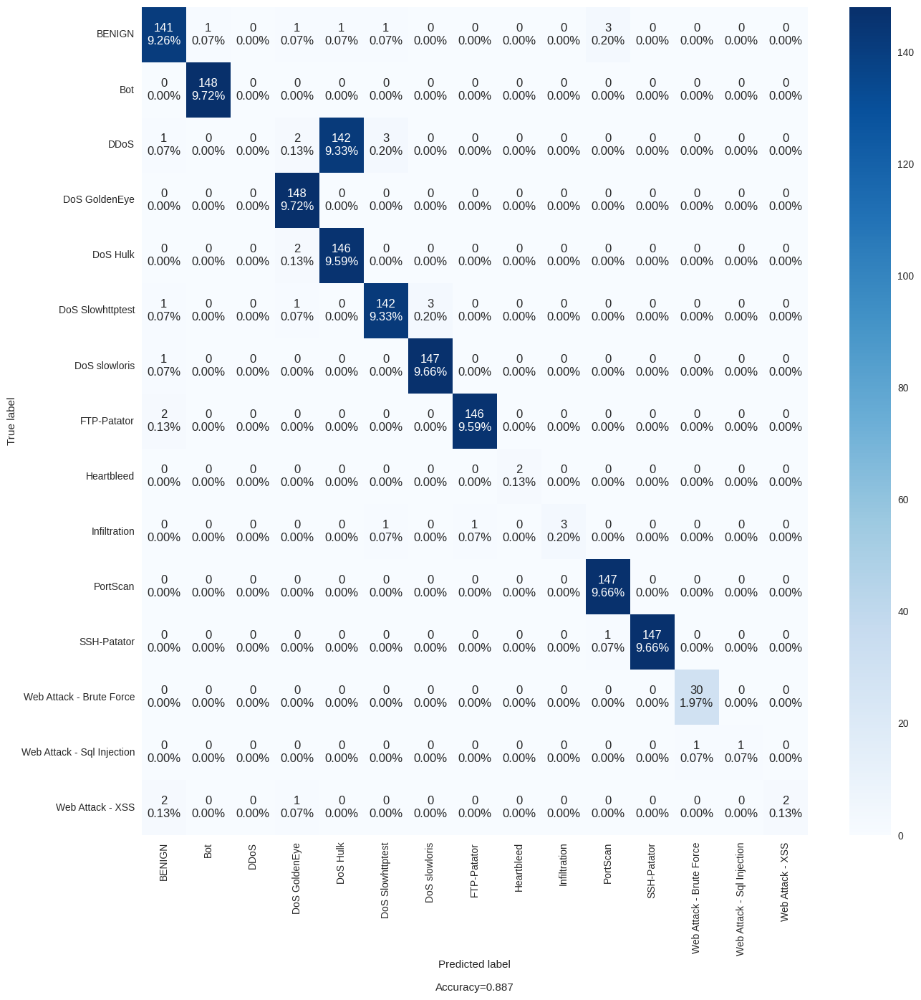

In [73]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [74]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DoS GoldenEye']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.7255061	total: 222ms	remaining: 8.67s
1:	learn: 1.3958997	total: 432ms	remaining: 8.2s
2:	learn: 1.1850042	total: 649ms	remaining: 8.01s
3:	learn: 1.0252493	total: 876ms	remaining: 7.88s
4:	learn: 0.9023239	total: 1.11s	remaining: 7.8s
5:	learn: 0.7943465	total: 1.35s	remaining: 7.65s
6:	learn: 0.7091266	total: 1.6s	remaining: 7.55s
7:	learn: 0.6380100	total: 1.84s	remaining: 7.38s
8:	learn: 0.5759757	total: 2.11s	remaining: 7.28s
9:	learn: 0.5252319	total: 2.37s	remaining: 7.12s
10:	learn: 0.4761988	total: 2.63s	remaining: 6.93s
11:	learn: 0.4358446	total: 2.88s	remaining: 6.72s
12:	learn: 0.3989872	total: 3.14s	remaining: 6.52s
13:	learn: 0.3654190	total: 3.39s	remaining: 6.3s
14:	learn: 0.3380721	total: 3.64s	remaining: 6.07s
15:	learn: 0.3126852	total: 3.88s	remaining: 5.83s
16:	learn: 0.2899245	total: 4.13s	remaining: 5.59s
17:	learn: 0.2700639	total: 4.4s	remaining: 5.37s
18:	learn: 0.2518213	total: 4.66s	remaining: 5.15s
19:	learn: 0.2356929	total: 4.92s	remaining: 4

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.991084,0.889619
1,PRECISION,0.991137,0.834525
2,RECALL,0.991084,0.889619
3,F1 SCORE,0.991053,0.855383


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


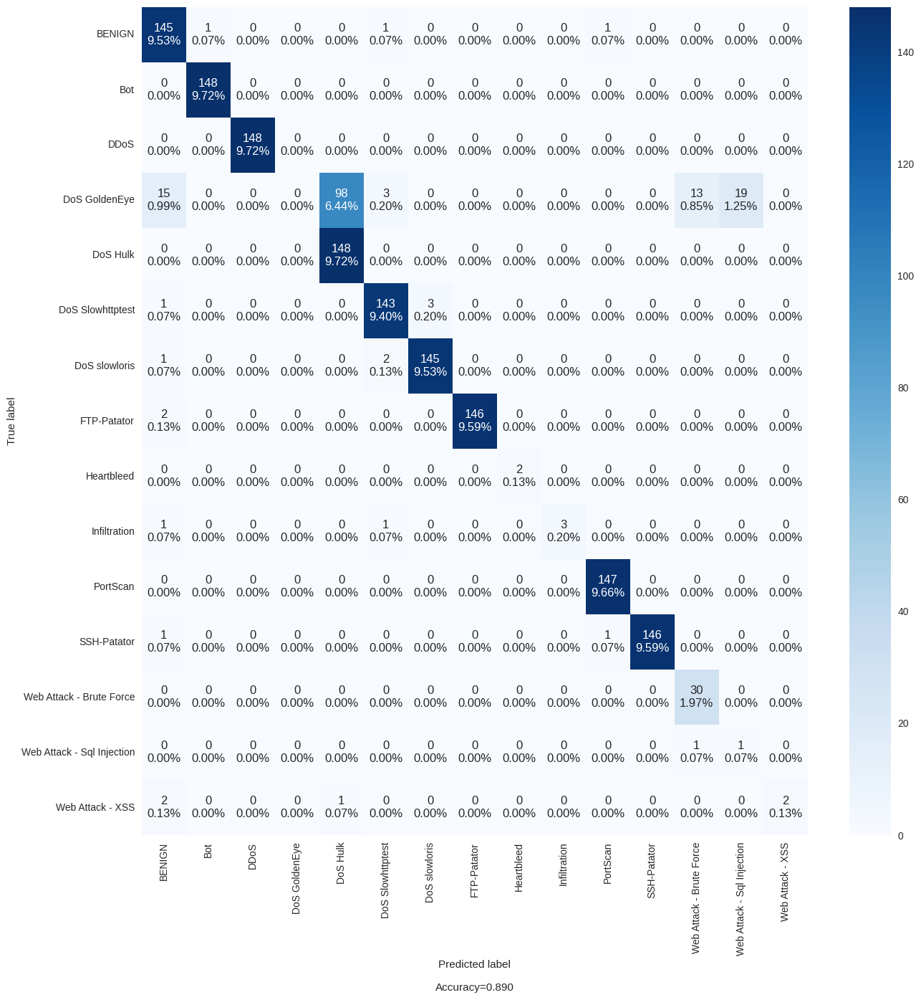

In [75]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [76]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DoS Hulk']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.7155314	total: 242ms	remaining: 9.43s
1:	learn: 1.3945941	total: 499ms	remaining: 9.48s
2:	learn: 1.1728149	total: 750ms	remaining: 9.25s
3:	learn: 1.0180558	total: 1.02s	remaining: 9.18s
4:	learn: 0.8932423	total: 1.33s	remaining: 9.29s
5:	learn: 0.7878256	total: 1.63s	remaining: 9.26s
6:	learn: 0.7059569	total: 1.93s	remaining: 9.09s
7:	learn: 0.6367452	total: 2.21s	remaining: 8.84s
8:	learn: 0.5746019	total: 2.5s	remaining: 8.63s
9:	learn: 0.5221973	total: 2.82s	remaining: 8.45s
10:	learn: 0.4748330	total: 3.11s	remaining: 8.21s
11:	learn: 0.4343735	total: 3.41s	remaining: 7.97s
12:	learn: 0.3982100	total: 3.72s	remaining: 7.72s
13:	learn: 0.3653964	total: 4.03s	remaining: 7.49s
14:	learn: 0.3384422	total: 4.34s	remaining: 7.23s
15:	learn: 0.3132015	total: 4.65s	remaining: 6.97s
16:	learn: 0.2913798	total: 4.97s	remaining: 6.73s
17:	learn: 0.2715447	total: 5.29s	remaining: 6.46s
18:	learn: 0.2528673	total: 5.63s	remaining: 6.22s
19:	learn: 0.2357212	total: 5.97s	remainin

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.989447,0.887648
1,PRECISION,0.989375,0.819143
2,RECALL,0.989447,0.887648
3,F1 SCORE,0.989318,0.847113


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


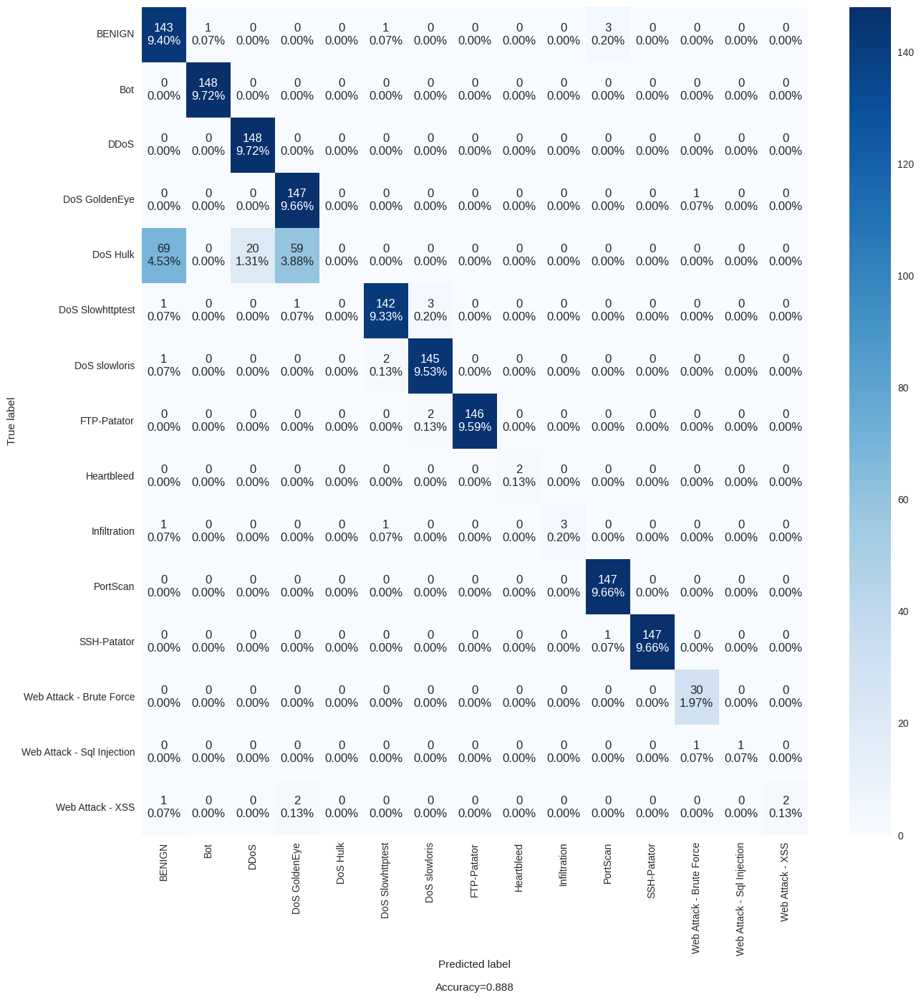

In [77]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [78]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DoS Slowhttptest']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.6873791	total: 379ms	remaining: 14.8s
1:	learn: 1.3604127	total: 808ms	remaining: 15.4s
2:	learn: 1.1445647	total: 1.15s	remaining: 14.1s
3:	learn: 0.9816775	total: 1.47s	remaining: 13.2s
4:	learn: 0.8568959	total: 1.79s	remaining: 12.5s
5:	learn: 0.7527059	total: 2.12s	remaining: 12s
6:	learn: 0.6676800	total: 2.44s	remaining: 11.5s
7:	learn: 0.5962845	total: 2.8s	remaining: 11.2s
8:	learn: 0.5353437	total: 3.15s	remaining: 10.9s
9:	learn: 0.4825938	total: 3.5s	remaining: 10.5s
10:	learn: 0.4375101	total: 3.82s	remaining: 10.1s
11:	learn: 0.3986000	total: 4.15s	remaining: 9.68s
12:	learn: 0.3632646	total: 4.48s	remaining: 9.31s
13:	learn: 0.3331026	total: 4.83s	remaining: 8.97s
14:	learn: 0.3060589	total: 5.16s	remaining: 8.6s
15:	learn: 0.2806515	total: 5.49s	remaining: 8.23s
16:	learn: 0.2584706	total: 5.82s	remaining: 7.87s
17:	learn: 0.2385659	total: 6.15s	remaining: 7.51s
18:	learn: 0.2211377	total: 6.48s	remaining: 7.16s
19:	learn: 0.2053030	total: 6.81s	remaining: 6

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.993631,0.892247
1,PRECISION,0.993584,0.839868
2,RECALL,0.993631,0.892247
3,F1 SCORE,0.993557,0.858012


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


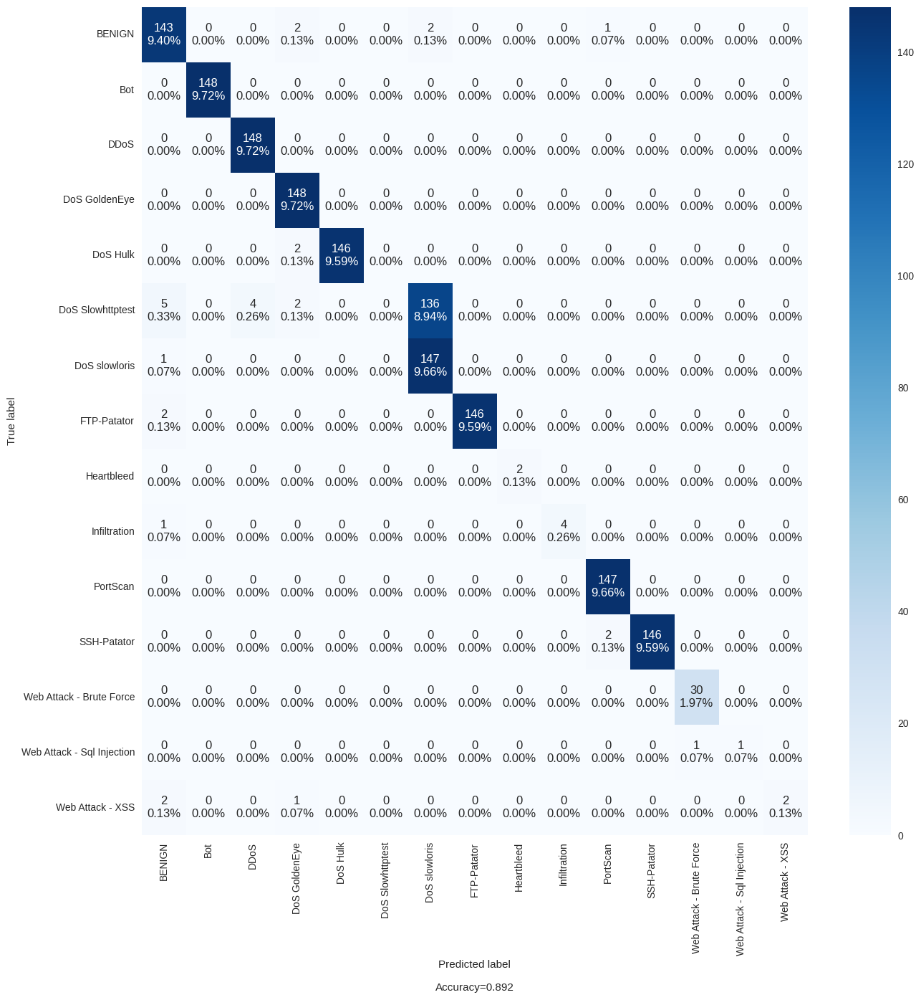

In [79]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [80]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'DoS slowloris']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.6766049	total: 441ms	remaining: 17.2s
1:	learn: 1.3505690	total: 845ms	remaining: 16s
2:	learn: 1.1402672	total: 1.19s	remaining: 14.7s
3:	learn: 0.9806688	total: 1.51s	remaining: 13.6s
4:	learn: 0.8523896	total: 1.82s	remaining: 12.8s
5:	learn: 0.7496373	total: 2.13s	remaining: 12.1s
6:	learn: 0.6667701	total: 2.45s	remaining: 11.5s
7:	learn: 0.5964107	total: 2.76s	remaining: 11s
8:	learn: 0.5363217	total: 3.08s	remaining: 10.6s
9:	learn: 0.4851775	total: 3.43s	remaining: 10.3s
10:	learn: 0.4410285	total: 3.74s	remaining: 9.85s
11:	learn: 0.4023503	total: 4.05s	remaining: 9.45s
12:	learn: 0.3672241	total: 4.36s	remaining: 9.05s
13:	learn: 0.3364424	total: 4.67s	remaining: 8.67s
14:	learn: 0.3101622	total: 4.98s	remaining: 8.3s
15:	learn: 0.2854347	total: 5.29s	remaining: 7.93s
16:	learn: 0.2639255	total: 5.59s	remaining: 7.57s
17:	learn: 0.2440576	total: 5.91s	remaining: 7.22s
18:	learn: 0.2260416	total: 6.25s	remaining: 6.9s
19:	learn: 0.2104051	total: 6.57s	remaining: 6.

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.993268,0.890276
1,PRECISION,0.993214,0.840273
2,RECALL,0.993268,0.890276
3,F1 SCORE,0.993220,0.856728


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


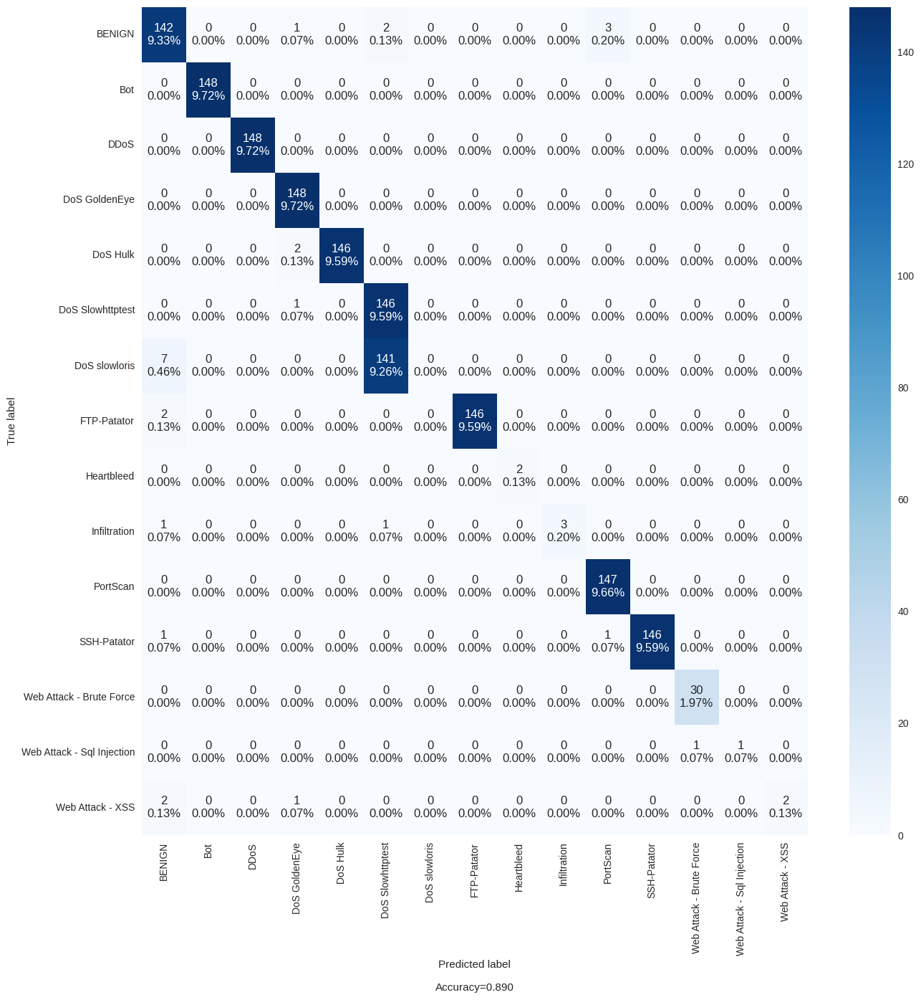

In [81]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [82]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'FTP-Patator']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.7463951	total: 559ms	remaining: 21.8s
1:	learn: 1.4129674	total: 992ms	remaining: 18.8s
2:	learn: 1.1985592	total: 1.36s	remaining: 16.8s
3:	learn: 1.0449253	total: 1.7s	remaining: 15.3s
4:	learn: 0.9150758	total: 2.05s	remaining: 14.3s
5:	learn: 0.8098459	total: 2.39s	remaining: 13.6s
6:	learn: 0.7226068	total: 2.73s	remaining: 12.9s
7:	learn: 0.6525655	total: 3.08s	remaining: 12.3s
8:	learn: 0.5909661	total: 3.42s	remaining: 11.8s
9:	learn: 0.5391322	total: 3.75s	remaining: 11.3s
10:	learn: 0.4904673	total: 4.07s	remaining: 10.7s
11:	learn: 0.4499733	total: 4.45s	remaining: 10.4s
12:	learn: 0.4126722	total: 4.76s	remaining: 9.89s
13:	learn: 0.3794846	total: 5.08s	remaining: 9.44s
14:	learn: 0.3514992	total: 5.43s	remaining: 9.05s
15:	learn: 0.3265398	total: 5.78s	remaining: 8.66s
16:	learn: 0.3041953	total: 6.12s	remaining: 8.28s
17:	learn: 0.2828067	total: 6.45s	remaining: 7.89s
18:	learn: 0.2646826	total: 6.83s	remaining: 7.55s
19:	learn: 0.2475705	total: 7.18s	remainin

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.988901,0.885677
1,PRECISION,0.988857,0.838388
2,RECALL,0.988901,0.885677
3,F1 SCORE,0.988762,0.853811


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


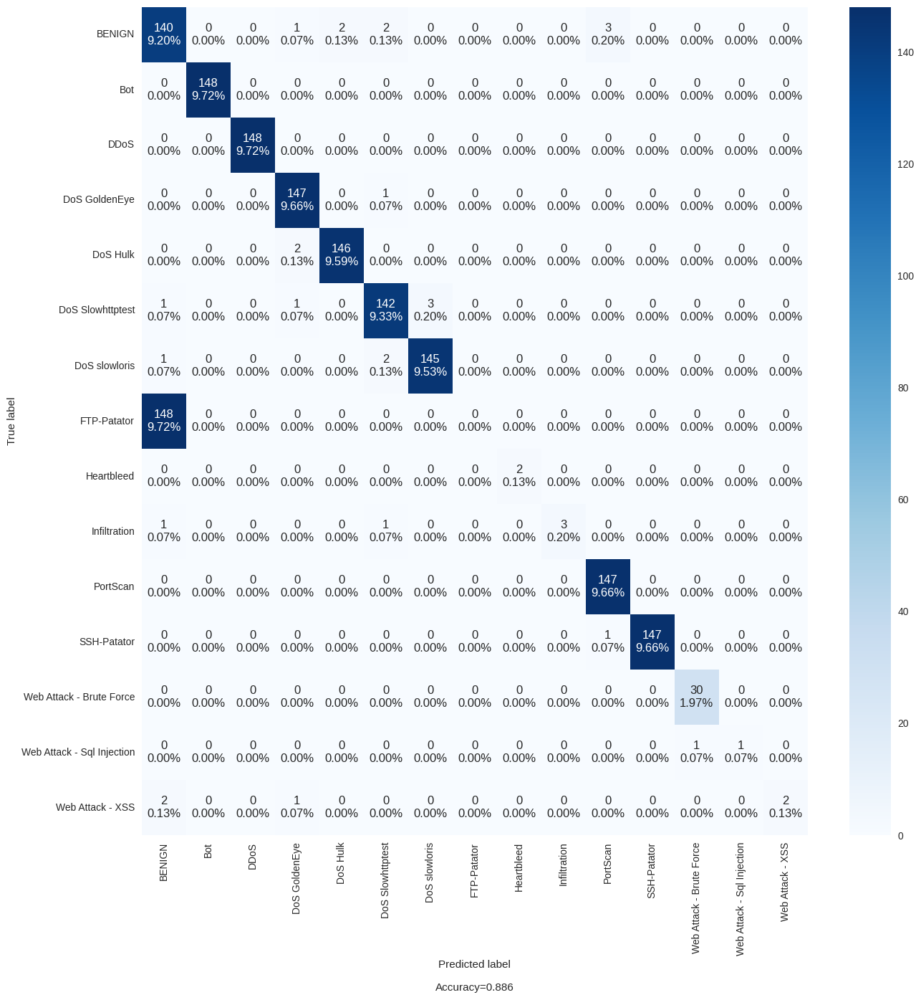

In [83]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [84]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Heartbleed']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.7458210	total: 421ms	remaining: 16.4s
1:	learn: 1.4149800	total: 761ms	remaining: 14.5s
2:	learn: 1.1990460	total: 1.11s	remaining: 13.7s
3:	learn: 1.0387366	total: 1.44s	remaining: 13s
4:	learn: 0.9076218	total: 1.77s	remaining: 12.4s
5:	learn: 0.8001909	total: 2.11s	remaining: 11.9s
6:	learn: 0.7127341	total: 2.43s	remaining: 11.5s
7:	learn: 0.6378813	total: 2.77s	remaining: 11.1s
8:	learn: 0.5765684	total: 3.1s	remaining: 10.7s
9:	learn: 0.5241889	total: 3.43s	remaining: 10.3s
10:	learn: 0.4788418	total: 3.78s	remaining: 9.96s
11:	learn: 0.4375824	total: 4.13s	remaining: 9.65s
12:	learn: 0.4004965	total: 4.46s	remaining: 9.27s
13:	learn: 0.3670308	total: 4.82s	remaining: 8.95s
14:	learn: 0.3379790	total: 5.16s	remaining: 8.6s
15:	learn: 0.3121313	total: 5.5s	remaining: 8.26s
16:	learn: 0.2894754	total: 5.83s	remaining: 7.89s
17:	learn: 0.2687326	total: 6.18s	remaining: 7.56s
18:	learn: 0.2505025	total: 6.52s	remaining: 7.21s
19:	learn: 0.2351716	total: 6.86s	remaining: 6

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.990785,0.982260
1,PRECISION,0.990770,0.981194
2,RECALL,0.990785,0.982260
3,F1 SCORE,0.990690,0.981119


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


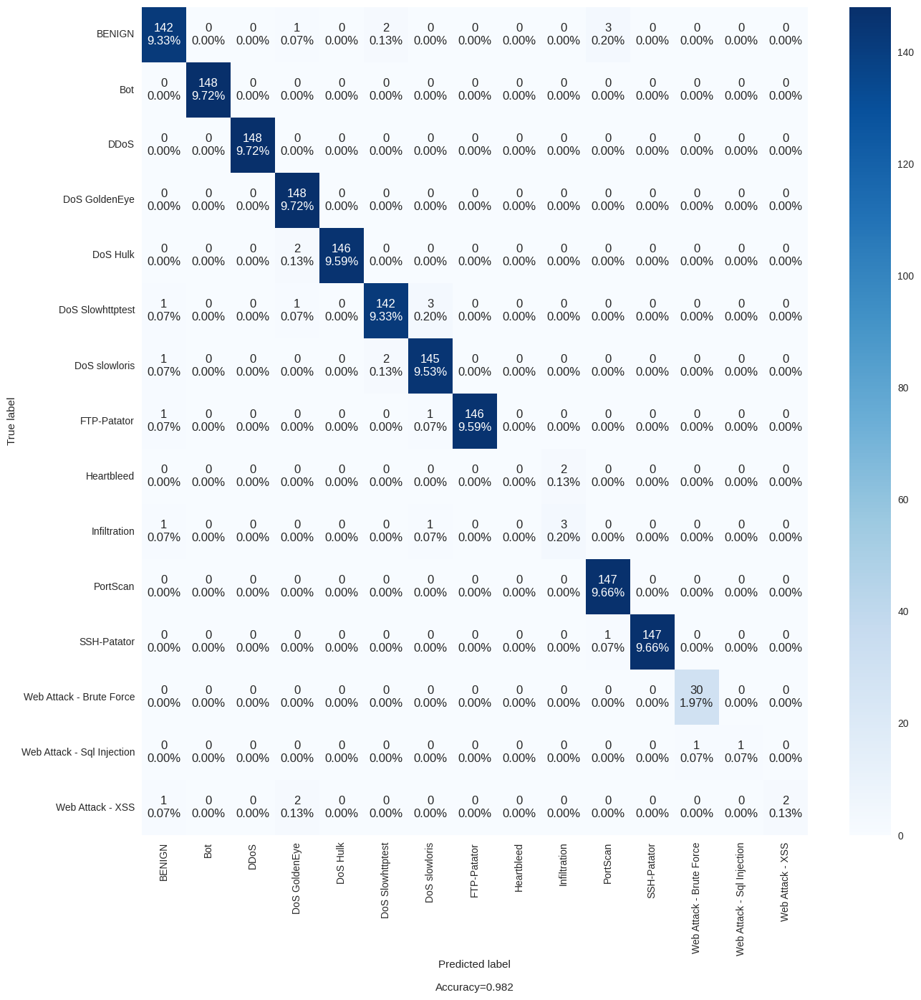

In [85]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [86]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Infiltration']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.7382849	total: 382ms	remaining: 14.9s


1:	learn: 1.3969885	total: 816ms	remaining: 15.5s
2:	learn: 1.1896175	total: 1.18s	remaining: 14.5s
3:	learn: 1.0299137	total: 1.51s	remaining: 13.6s
4:	learn: 0.9006557	total: 1.82s	remaining: 12.8s
5:	learn: 0.7944541	total: 2.17s	remaining: 12.3s
6:	learn: 0.7085461	total: 2.5s	remaining: 11.8s
7:	learn: 0.6368838	total: 2.83s	remaining: 11.3s
8:	learn: 0.5756660	total: 3.19s	remaining: 11s
9:	learn: 0.5217498	total: 3.54s	remaining: 10.6s
10:	learn: 0.4735119	total: 3.85s	remaining: 10.2s
11:	learn: 0.4337231	total: 4.2s	remaining: 9.81s
12:	learn: 0.3970236	total: 4.54s	remaining: 9.44s
13:	learn: 0.3641003	total: 4.87s	remaining: 9.05s
14:	learn: 0.3351878	total: 5.22s	remaining: 8.7s
15:	learn: 0.3101336	total: 5.56s	remaining: 8.34s
16:	learn: 0.2877186	total: 5.88s	remaining: 7.96s
17:	learn: 0.2673729	total: 6.21s	remaining: 7.59s
18:	learn: 0.2494555	total: 6.54s	remaining: 7.23s
19:	learn: 0.2327709	total: 6.85s	remaining: 6.85s
20:	learn: 0.2178640	total: 7.19s	remaining: 

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.992084,0.983574
1,PRECISION,0.992153,0.980607
2,RECALL,0.992084,0.983574
3,F1 SCORE,0.991951,0.981472


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


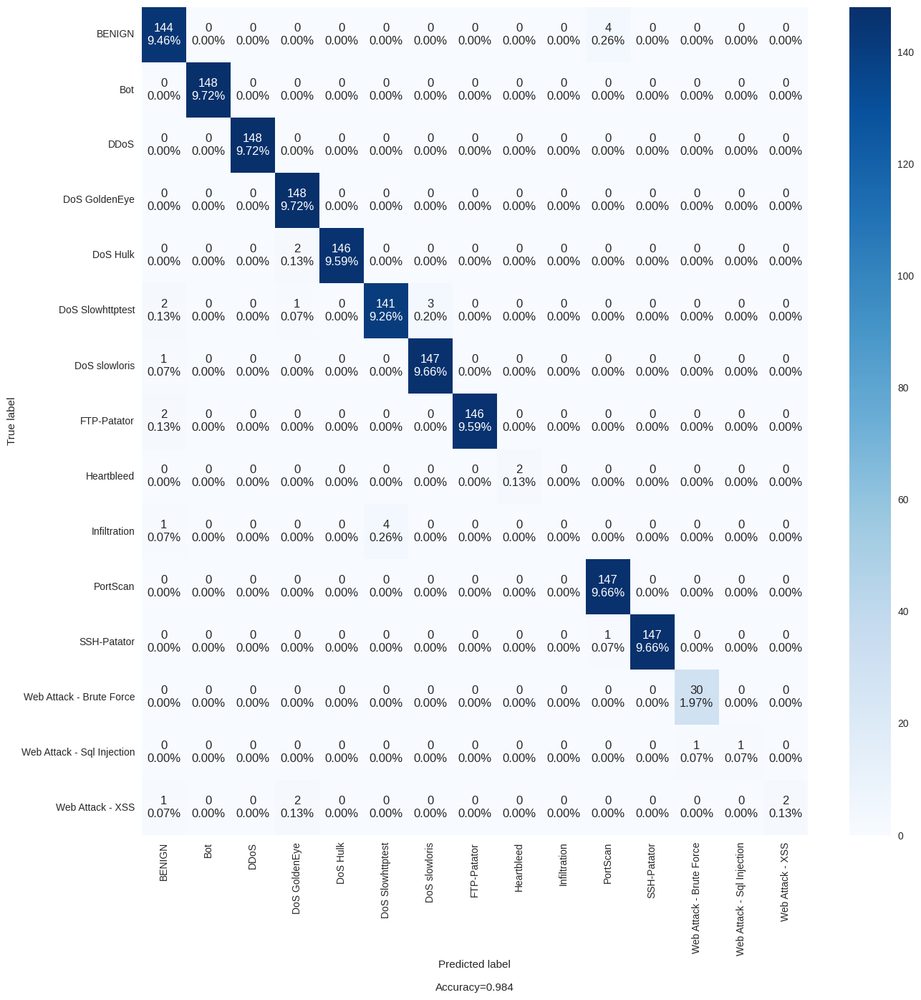

In [87]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [88]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'PortScan']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.7534878	total: 459ms	remaining: 17.9s
1:	learn: 1.4251938	total: 847ms	remaining: 16.1s
2:	learn: 1.2190000	total: 1.2s	remaining: 14.8s
3:	learn: 1.0508997	total: 1.51s	remaining: 13.6s
4:	learn: 0.9199871	total: 1.84s	remaining: 12.9s
5:	learn: 0.8140131	total: 2.15s	remaining: 12.2s
6:	learn: 0.7257001	total: 2.48s	remaining: 11.7s
7:	learn: 0.6538796	total: 2.8s	remaining: 11.2s
8:	learn: 0.5896885	total: 3.11s	remaining: 10.7s
9:	learn: 0.5369085	total: 3.42s	remaining: 10.3s
10:	learn: 0.4897888	total: 3.73s	remaining: 9.84s
11:	learn: 0.4481734	total: 4.04s	remaining: 9.43s
12:	learn: 0.4119811	total: 4.36s	remaining: 9.06s
13:	learn: 0.3801845	total: 4.69s	remaining: 8.72s
14:	learn: 0.3527317	total: 5.01s	remaining: 8.35s
15:	learn: 0.3254431	total: 5.33s	remaining: 7.99s
16:	learn: 0.3019284	total: 5.66s	remaining: 7.66s
17:	learn: 0.2798039	total: 6s	remaining: 7.33s
18:	learn: 0.2617062	total: 6.34s	remaining: 7.01s
19:	learn: 0.2458327	total: 6.68s	remaining: 6

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.989627,0.890276
1,PRECISION,0.989580,0.843586
2,RECALL,0.989627,0.890276
3,F1 SCORE,0.989481,0.858153


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


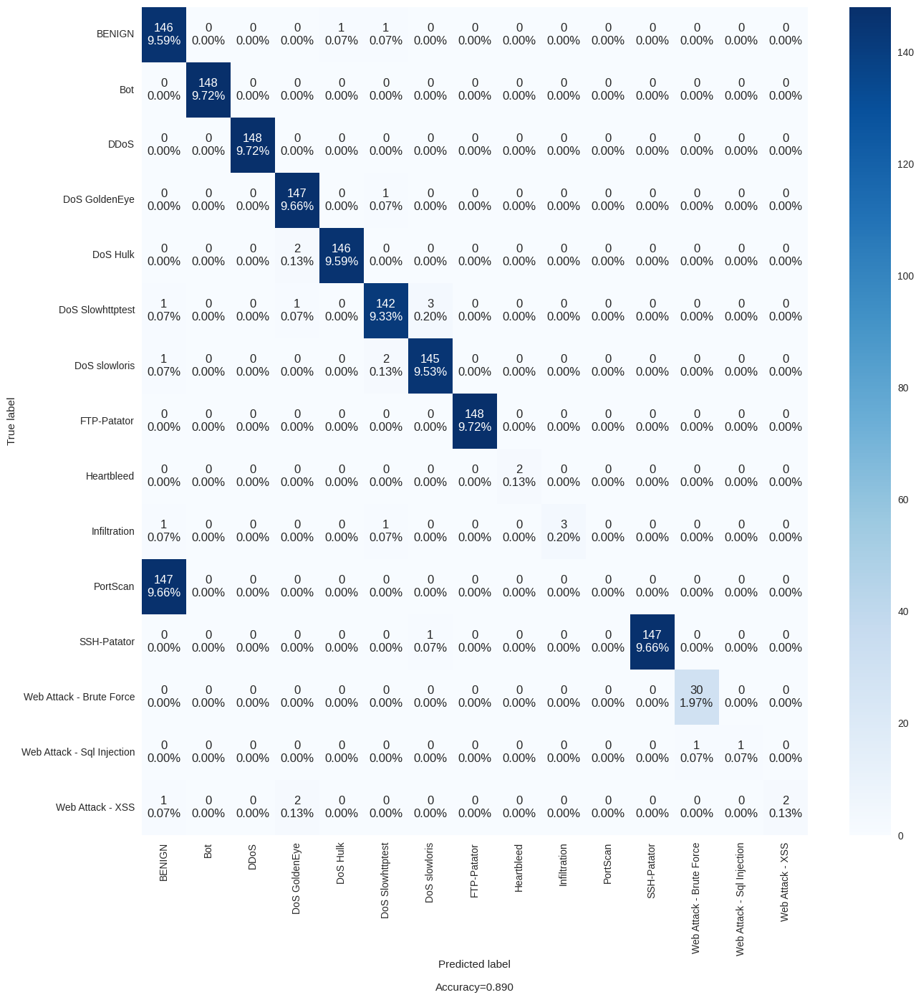

In [89]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [90]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'SSH-Patator']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.7411223	total: 381ms	remaining: 14.8s
1:	learn: 1.4012694	total: 720ms	remaining: 13.7s
2:	learn: 1.1914301	total: 1.02s	remaining: 12.6s
3:	learn: 1.0290109	total: 1.39s	remaining: 12.5s
4:	learn: 0.9057244	total: 1.74s	remaining: 12.2s
5:	learn: 0.8019984	total: 2.07s	remaining: 11.7s
6:	learn: 0.7156937	total: 2.4s	remaining: 11.3s
7:	learn: 0.6441473	total: 2.74s	remaining: 11s
8:	learn: 0.5818796	total: 3.07s	remaining: 10.6s
9:	learn: 0.5287293	total: 3.43s	remaining: 10.3s
10:	learn: 0.4805343	total: 3.78s	remaining: 9.96s
11:	learn: 0.4392021	total: 4.11s	remaining: 9.6s
12:	learn: 0.4010704	total: 4.45s	remaining: 9.24s
13:	learn: 0.3687152	total: 4.78s	remaining: 8.87s
14:	learn: 0.3412018	total: 5.09s	remaining: 8.49s
15:	learn: 0.3167260	total: 5.42s	remaining: 8.14s
16:	learn: 0.2936027	total: 5.78s	remaining: 7.82s
17:	learn: 0.2724828	total: 6.1s	remaining: 7.45s
18:	learn: 0.2536055	total: 6.45s	remaining: 7.13s
19:	learn: 0.2378861	total: 6.77s	remaining: 6

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.990175,0.891590
1,PRECISION,0.990231,0.844508
2,RECALL,0.990175,0.891590
3,F1 SCORE,0.990091,0.859510


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


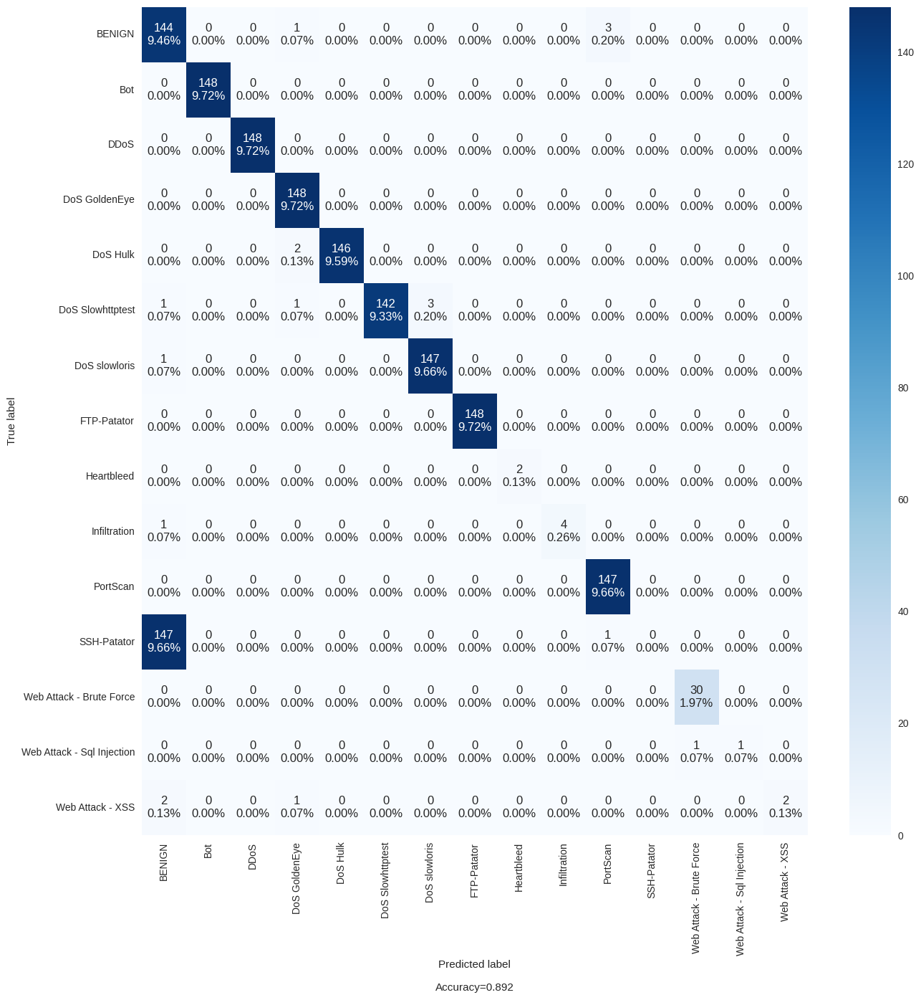

In [91]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [92]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Web Attack - Brute Force']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.7580699	total: 433ms	remaining: 16.9s
1:	learn: 1.4093085	total: 911ms	remaining: 17.3s
2:	learn: 1.1917895	total: 1.26s	remaining: 15.6s
3:	learn: 1.0283567	total: 1.57s	remaining: 14.1s
4:	learn: 0.8951983	total: 1.9s	remaining: 13.3s
5:	learn: 0.7923267	total: 2.24s	remaining: 12.7s
6:	learn: 0.7086545	total: 2.6s	remaining: 12.3s
7:	learn: 0.6374275	total: 2.94s	remaining: 11.8s
8:	learn: 0.5742896	total: 3.27s	remaining: 11.3s
9:	learn: 0.5212836	total: 3.6s	remaining: 10.8s
10:	learn: 0.4726029	total: 3.95s	remaining: 10.4s
11:	learn: 0.4321331	total: 4.29s	remaining: 10s
12:	learn: 0.3950911	total: 4.62s	remaining: 9.59s
13:	learn: 0.3627077	total: 4.94s	remaining: 9.18s
14:	learn: 0.3340886	total: 5.28s	remaining: 8.8s
15:	learn: 0.3080637	total: 5.61s	remaining: 8.41s
16:	learn: 0.2851650	total: 5.93s	remaining: 8.03s
17:	learn: 0.2639159	total: 6.26s	remaining: 7.66s
18:	learn: 0.2461330	total: 6.6s	remaining: 7.29s
19:	learn: 0.2303599	total: 6.93s	remaining: 6.9

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.991115,0.963863
1,PRECISION,0.991132,0.946592
2,RECALL,0.991115,0.963863
3,F1 SCORE,0.991051,0.954052


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


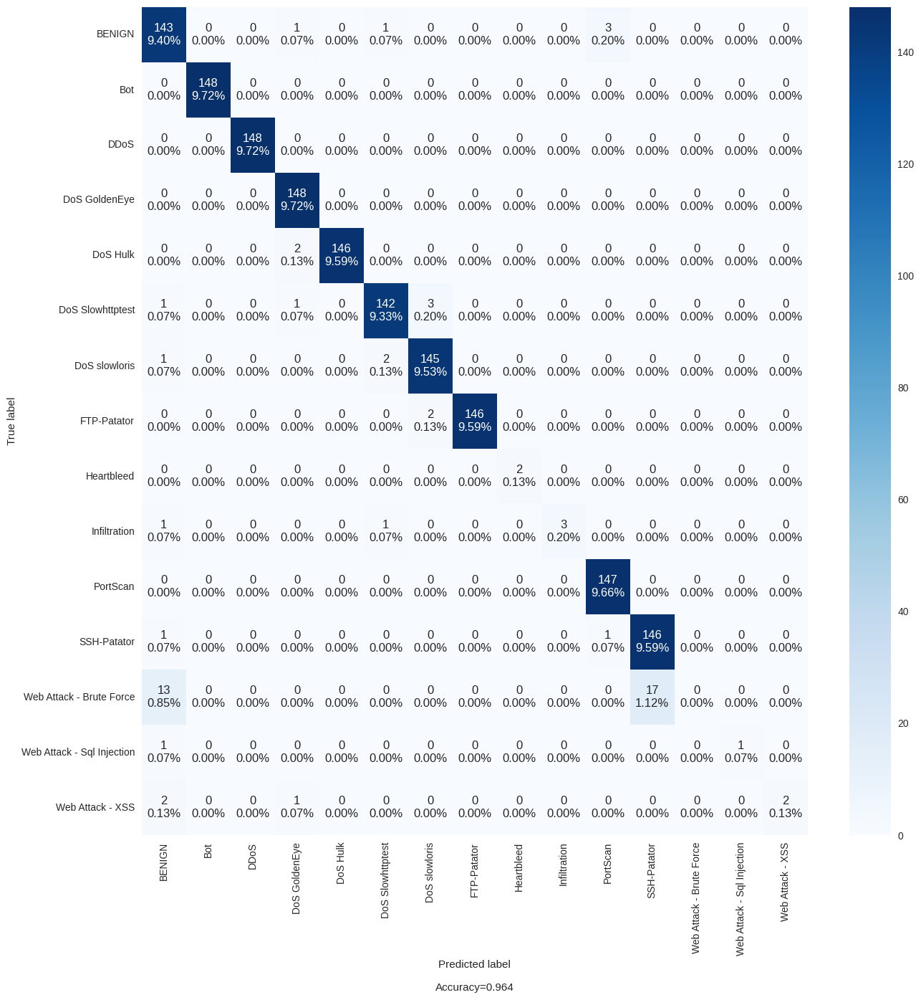

In [93]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [94]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Web Attack - Sql Injection']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.7130412	total: 431ms	remaining: 16.8s
1:	learn: 1.3818702	total: 810ms	remaining: 15.4s
2:	learn: 1.1768900	total: 1.27s	remaining: 15.7s
3:	learn: 1.0160016	total: 1.59s	remaining: 14.3s
4:	learn: 0.8856630	total: 1.9s	remaining: 13.3s
5:	learn: 0.7820863	total: 2.21s	remaining: 12.5s
6:	learn: 0.6983298	total: 2.55s	remaining: 12s
7:	learn: 0.6265791	total: 2.9s	remaining: 11.6s
8:	learn: 0.5658546	total: 3.24s	remaining: 11.2s
9:	learn: 0.5137473	total: 3.57s	remaining: 10.7s
10:	learn: 0.4676785	total: 3.88s	remaining: 10.2s
11:	learn: 0.4286870	total: 4.21s	remaining: 9.83s
12:	learn: 0.3918932	total: 4.53s	remaining: 9.42s
13:	learn: 0.3601006	total: 4.86s	remaining: 9.02s
14:	learn: 0.3317887	total: 5.19s	remaining: 8.65s
15:	learn: 0.3075443	total: 5.53s	remaining: 8.29s
16:	learn: 0.2859401	total: 5.88s	remaining: 7.95s
17:	learn: 0.2649311	total: 6.21s	remaining: 7.59s
18:	learn: 0.2466462	total: 6.55s	remaining: 7.25s
19:	learn: 0.2305116	total: 6.87s	remaining: 

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.991935,0.984888
1,PRECISION,0.992012,0.983796
2,RECALL,0.991935,0.984888
3,F1 SCORE,0.991897,0.983784


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


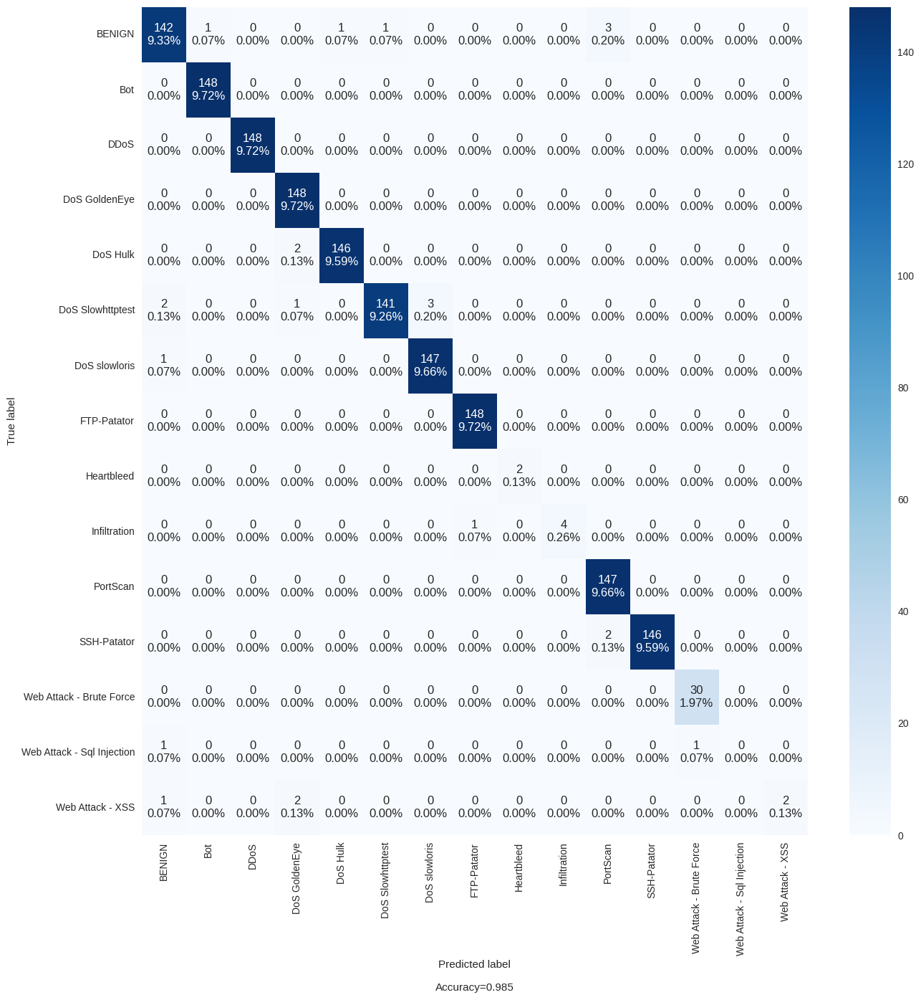

In [95]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [96]:
y_train_attack = y_train.reset_index(drop=True)
y_train_attack = y_train_attack[y_train_attack != 'Web Attack - XSS']
X_train_attack = X_train.reset_index(drop=True)
X_train_attack = X_train_attack.iloc[y_train_attack.index]
cat.fit(X_train_attack, y_train_attack)
y_predicted_train = cat.predict(X_train_attack)
y_predicted_test = cat.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test, y_predicted_test, 'weighted')

0:	learn: 1.7440909	total: 427ms	remaining: 16.6s
1:	learn: 1.4022950	total: 850ms	remaining: 16.1s
2:	learn: 1.1866929	total: 1.17s	remaining: 14.4s
3:	learn: 1.0246186	total: 1.48s	remaining: 13.3s
4:	learn: 0.8918860	total: 1.8s	remaining: 12.6s
5:	learn: 0.7864216	total: 2.11s	remaining: 12s
6:	learn: 0.7007286	total: 2.43s	remaining: 11.5s
7:	learn: 0.6292376	total: 2.76s	remaining: 11s
8:	learn: 0.5684534	total: 3.08s	remaining: 10.6s
9:	learn: 0.5160535	total: 3.39s	remaining: 10.2s
10:	learn: 0.4710846	total: 3.72s	remaining: 9.8s
11:	learn: 0.4309716	total: 4.05s	remaining: 9.45s
12:	learn: 0.3940940	total: 4.36s	remaining: 9.06s
13:	learn: 0.3607382	total: 4.67s	remaining: 8.68s
14:	learn: 0.3327095	total: 4.99s	remaining: 8.31s
15:	learn: 0.3081999	total: 5.31s	remaining: 7.96s
16:	learn: 0.2855126	total: 5.63s	remaining: 7.61s
17:	learn: 0.2648249	total: 5.95s	remaining: 7.27s
18:	learn: 0.2462511	total: 6.27s	remaining: 6.93s
19:	learn: 0.2305557	total: 6.59s	remaining: 6.

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.992744,0.984231
1,PRECISION,0.992815,0.981358
2,RECALL,0.992744,0.984231
3,F1 SCORE,0.992716,0.982404


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


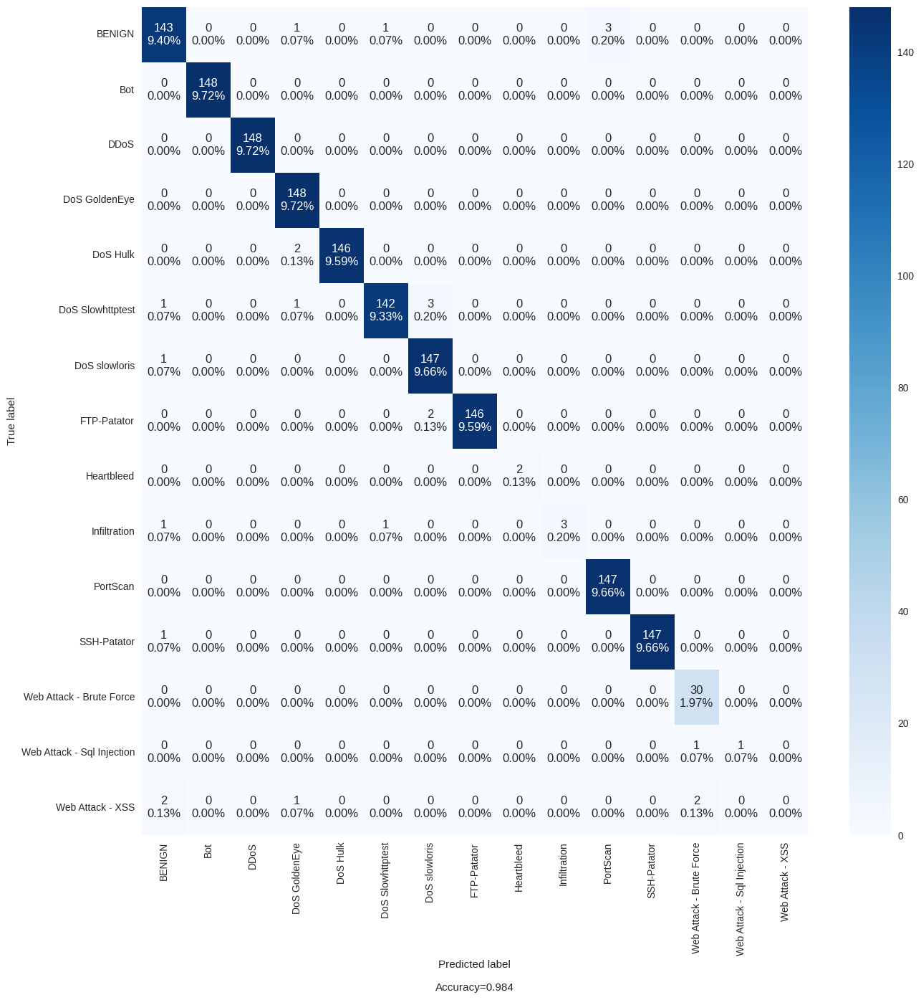

In [97]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(classes)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))